# GG4257 - Urban Analytics: A Toolkit for Sustainable Urban Development
## Lab Assignment No 2: Networks, Geodemographics and Spatial Microsimulation.
---
Dr Fernando Benitez -  University of St Andrews - School of Geography and Sustainable Development - Iteration 2025

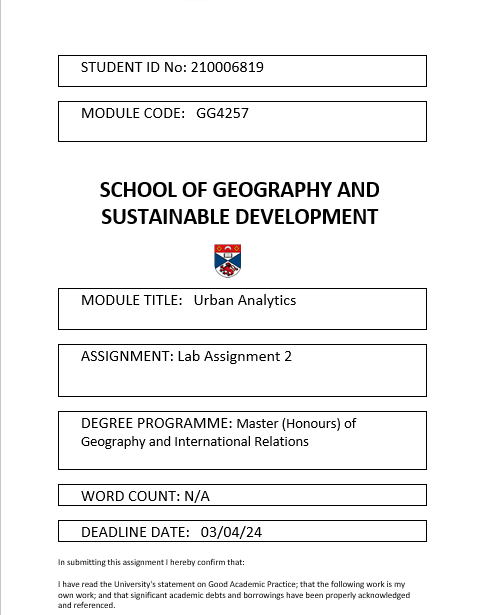

## GitHub Repository Link:
---

https://github.com/nb229-coder/210006819_UA_LA2.git

# Academic Practice:

As always, The University policy on Good Academic Practice applies. There are probably many ways to address the challenges in here or part of them. You are free to do research and find relevant resources, like the documentation website, if you cited them correctly. But I strongly advise not to use AI tools, most importantly because you won't learn/practice as you are supposed to.

If you are not aware of **our academic misconduct policy**, kindly take a quick look (Pag 8. https://www.st-ndrews.ac.uk/policy/academic-policies-assessment-examination-and-award-good-academic-practice/good-academic-practice-guidance-for-students-frequently-asked-questions.pdf)

*Table of Contents*
- Cover Page
- Lab 5: Intro to Networks
- Lab 6: Geodemographics
- Lab 7: Spatial Microsimulation
- Final Remarks

# Introduction  - How to replicate the code and get the required data

Once you have followed the GitHub Repo link attached at the top of the document, select the green 'Code' button and then copy the HTTPS url. Open the MiniForge Comand Prompt and set the desired directory for the clone to occur and the run the "git clone" command with the HTTPS url you copied from earlier. After creating a cloned copy in your desired location you should change the working directory to wherever the cloned repository resides and launch it in Jupyter Lab.  

#### Stored Data can be found here:
https://drive.google.com/drive/folders/1DGFcljgNbpwz_opTR8e1vPND1SRw2Smn?usp=sharing

The link attached above to a public Google Drive folder contains all external data sources necessary for this code to be fully reproducible. Rather than test the RAM limits of the Jupyter Notebook I have begun each Lab explaining which data sources need to be pulled from said folder. This section in each lab will be in bold and titled **'Pull Data Here'**. There are lines of code designated for when it needs to be read into the notebook but the upload should occur when first mentioned.

# Lab No. 5: Intro to Networks

**'Pull Data Here'**
For Lab 1 the following files need to be pulled and uploaded to the local file folder:
- ego-twitter.p
- FS.csv
- FS_pickled
- lake_placid_ntwk.gpkg
- lake_placid_ntwk.gpkg


## Assembling the environment

In [12]:
# Here I am loading in the necessary libraries and packages that were used in the exercises
import warnings
warnings.simplefilter('ignore', DeprecationWarning)
warnings.filterwarnings('ignore')

import pandas as pd
!pip install networkx
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
import random

## Challenge 1: 
It's time for you to apply everything you learned by analyzing a case study of FourSquare social Network. (Foursquare is a location-based online social network. The dataset contains a list of all of the user-to-user links)

Datasource: @inproceedings{gao2012exploring,
     title={Exploring social-historical ties on location-based social networks},
     author={Gao, Huiji and Tang, Jiliang and Liu, Huan},
     booktitle={Proceedings of the 6th International AAAI Conference on Weblogs and Social Media},
     year={2012}
}

- **Data**: `FS.csv` (avaliable in Moodle)

**1A.**. Read the FS network dataset.

**1B**. Describe using the basic functions of the graph's size. Explore nodes and edges. Provide how many nodes and edges are present in the network.

**1C.** The dataset generates a graph of 639.014 nodes, so it is massive and you won't see anything meaningful if you try to plot it. So you need to create a subset using the **degree centrality** to find out find the top 4 of the most important nodes, and use them to create a subset of the original network. 

**1D.** Extract the degree centrality values and convert them into a list. Then, plot a histogram to visualize the distribution of node degrees in the original network.

**1E.** Create a plot for the subset created.

**1F.** Now calculate another relevant measure of the network -- **betweenness centrality**. Plot the betweenness centrality distribution of the subset you created. Tip: Same steps from the previous step, but use `nx.betweenness_centrality()`

**1G.** Plot the Matrix, Arc and Circos from the subset.

---

**1A**. Read the FS network dataset.

**Pull Data Here**
- lab_5/FS.csv

In [2]:
# Now I am setting the path to this file, which will be linked in a Google Drive folder called 'GG4257 Assignment 2'
fs_path = "lab_5/FS.csv"
fs_df = pd.read_csv(fs_path)
fs_df.head()
# Here I have requested the first five rows of the data to see that it is read into the dataset

,source,target
0,34802,0
1,48213,0
2,52194,0
3,67112,0
4,72662,0


In [6]:
# I can reach the Networkx graph without having to convert to pickle in this case
fs = nx.from_pandas_edgelist(fs_df, source="source", target="target")

---

**1B**. Describe using the basic functions of the graph's size. Explore nodes and edges. Provide how many nodes and edges are present in the network.

In [7]:
# Here I can make things easy since there are a lot of them I can focus on just getting the count
num_nodes = len(fs.nodes)
print(f"Number of nodes: {num_nodes}")

# Same for the number of edges
num_edges = len(fs.edges)
print(f"Number of edges: {num_edges}")


Number of nodes: 639014
Number of edges: 3214986


Here, the len function returns the numeric length of the nodes and edges category so we can deduce how many nodes and edges are present in the network.

**1C.** The dataset generates a graph of 639.014 nodes, so it is massive and you won't see anything meaningful if you try to plot it. So you need to create a subset using the **degree centrality** to find out find the top 4 of the most important nodes, and use them to create a subset of the original network. 

Top 4 Nodes based on Degree Centrality: [106223, 89302, 76517, 66999]


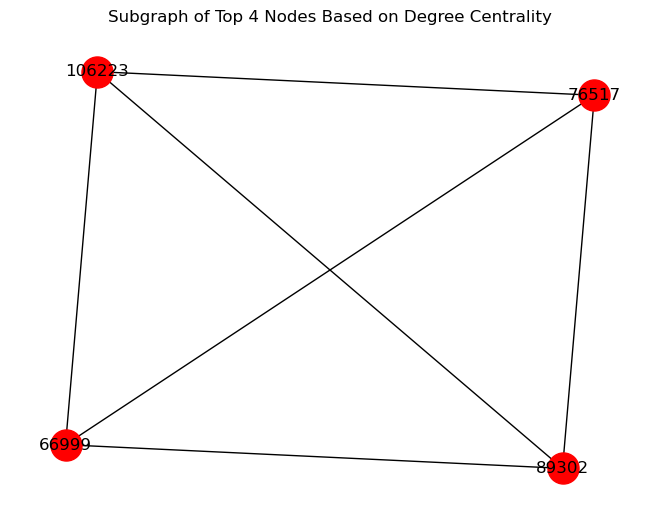

In [8]:
# Ok so here is the main degree centrality operation before the subset
fs_degree_centrality = nx.degree_centrality(fs)

# I need to sort so its not every node that I try to plot, so I need to take
top4_nodes = sorted(fs_degree_centrality, key=fs_degree_centrality.get, reverse=True)[:4]
print("Top 4 Nodes based on Degree Centrality:", top4_nodes)

# Following the previous workflow this simple function will create the subgraph and then I can attempt to visualise it
node_subgraph = fs.subgraph(top4_nodes)

# Then here I can see what my nodes are and their relationship to one another
pos = nx.spring_layout(node_subgraph)  
nx.draw(node_subgraph, pos, with_labels=True, node_size=500, node_color='red')
plt.title('Subgraph of Top 4 Nodes Based on Degree Centrality')
plt.show()

To produce this subgraph we need to query the dataset using the 'sorted' function, which will return the nodes with the most connections. From there, I can see which nodes have the highest degree centrality.

---

**1D.** Extract the degree centrality values and convert them into a list. Then, plot a histogram to visualize the distribution of node degrees in the original network.

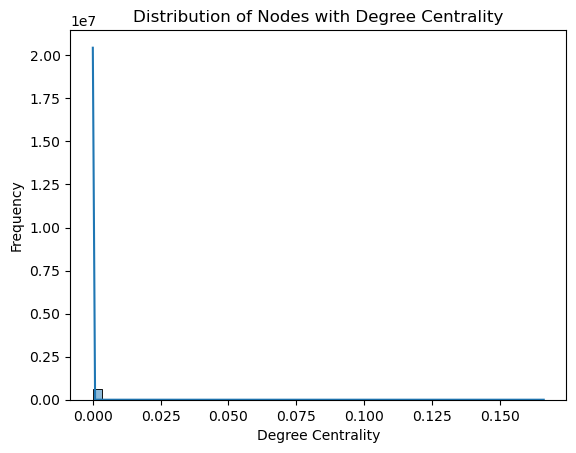

In [9]:
# Here I am extracting the degree centrality values and storing them into a list
degree_centrality_values = list(fs_degree_centrality.values())

# Here I plot my histogram to show the distribution of the nodes
# Not sure how to make sure its in the original network
# I think I could show this better potentially given how odd it looks
sns.histplot(degree_centrality_values, bins=50, kde=True)
plt.xlabel("Degree Centrality")
plt.ylabel("Frequency")
plt.title("Distribution of Nodes with Degree Centrality")
plt.show()

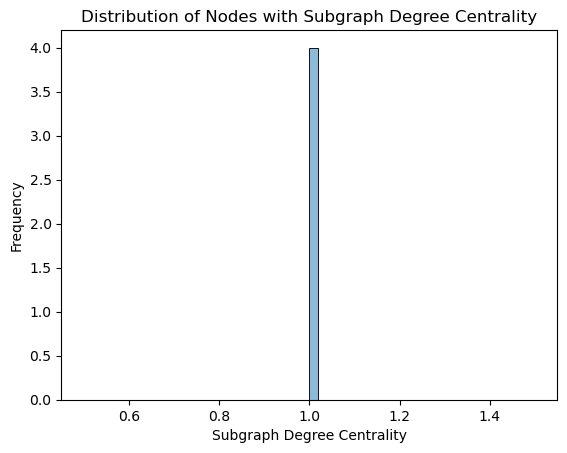

In [10]:
# I want to convert this to its own set of values so it can be implemented in a bar chart because it is currently stuck as a networkx
subgraph_degree_centrality = nx.degree_centrality(node_subgraph)

# The I can follow the workflow for the original network
subgraph_centrality_values = list(subgraph_degree_centrality.values())

sns.histplot(subgraph_centrality_values, bins=50, kde=True)
plt.xlabel("Subgraph Degree Centrality")
plt.ylabel("Frequency")b
plt.title("Distribution of Nodes with Subgraph Degree Centrality")
plt.show()


Here, I have first extracted the node_subgraph into its own list called subgraph_degree_centrality which stores these values as a list. Once they're stored as a alist they can be shown in a histogram plot. This histogram plot tells us that the four top nodes all have a degree centrality score of 1.0, which indicates that all of them are connected to one another. 


---

**1F.** Now calculate another relevant measure of the network -- **betweenness centrality**. Plot the betweenness centrality distribution of the subset you created. Tip: Same steps from the previous step, but use `nx.betweenness_centrality()`

Here I need to create a subset using the betweenness centrality to find out find 10 nodes with less than 15 connections. Therefore, I will follow the creation of the subset for degree centrality starting with the subsetting of the fs_df. Because of the size of the network I need to first filter and sort the network before attempting to perform betweenness centrality measures.

In [30]:
# This creates a dictionary which stores the number of edges (degrees) for each node.
node_degrees = dict(fs.degree())

# Here I am trying to filter for nodes with fewer than 15 connections so it can be effectively visualised with graphs
filtered_nodes = [node for node, degree in node_degrees.items() if degree < 15]

# This needs a condition just in case there are not enough nodes that meet the conditions from the list
if len(filtered_nodes) >= 10:
    random_nodes = random.sample(filtered_nodes, 10)
else:
    print("There are not enough nodes that meet the criteria.")
    random_nodes = filtered_nodes


bt_random_subgraph = fs.subgraph(random_nodes)

10 Random Nodes with Fewer Than 15 Connections: [44740, 357, 18121, 17258, 80201, 9548, 50859, 786, 56155, 151327]


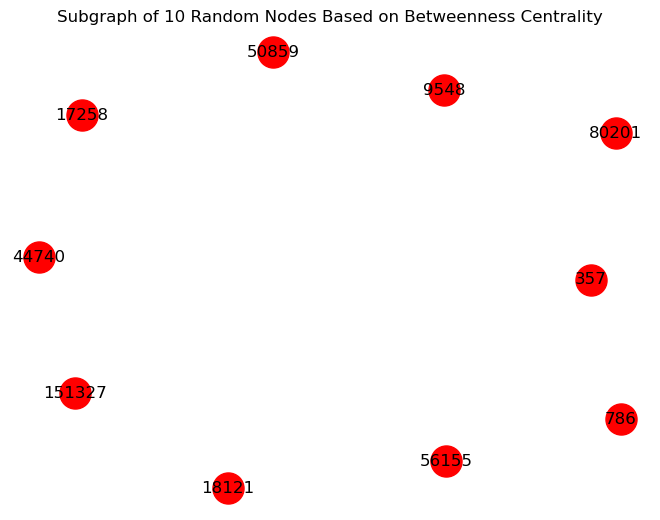

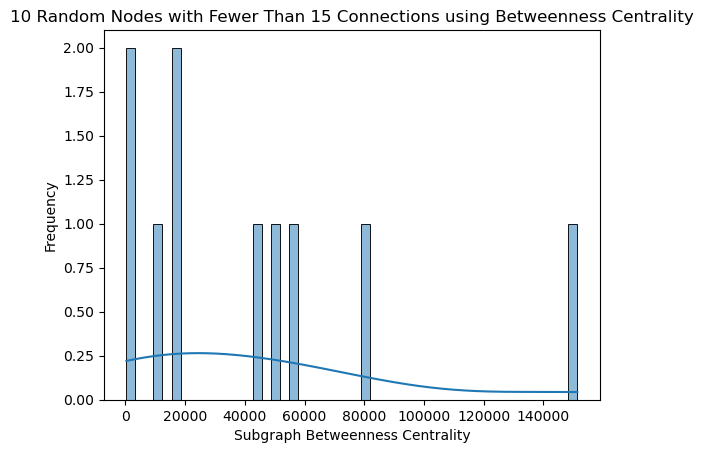

In [28]:
# I want to convert this to its own set of values so it can be implemented in a bar chart because it is currently stuck as a networkx
subgraph_bt_centrality = nx.betweenness_centrality(bt_random_subgraph)

# The I can follow the workflow for the original network
subgraph_centrality_values = list(subgraph_bt_centrality.values())

# I need to sort so its not every node that I try to plot, so I need to take
bt10_nodes = sorted(subgraph_bt_centrality, key=subgraph_bt_centrality.get, reverse=True)[:10]
print("10 Random Nodes with Fewer Than 15 Connections:", bt10_nodes)

# Following the previous workflow this simple function will create the subgraph and then I can attempt to visualise it
node10_subgraph = fs.subgraph(bt10_nodes)

# Then here I can see what my nodes are and their relationship to one another
pos = nx.spring_layout(node10_subgraph)  
nx.draw(node10_subgraph, pos, with_labels=True, node_size=500, node_color='red')
plt.title('Subgraph of 10 Random Nodes Based on Betweenness Centrality')
plt.show()

sns.histplot(bt10_nodes, bins=50, kde=True)
plt.xlabel("Subgraph Betweenness Centrality")
plt.ylabel("Frequency")
plt.title("10 Random Nodes with Fewer Than 15 Connections using Betweenness Centrality")
plt.show()

Based on the subgraph we can see that none of the randomly selected nodes share edges with one another. These nodes may have connections with other unselected nodes in the dataset but they do not match any of the randomly selected ones.

--

**1G.** Plot the Matrix, Arc and Circos from the subset.

**MATRIX PLOT**

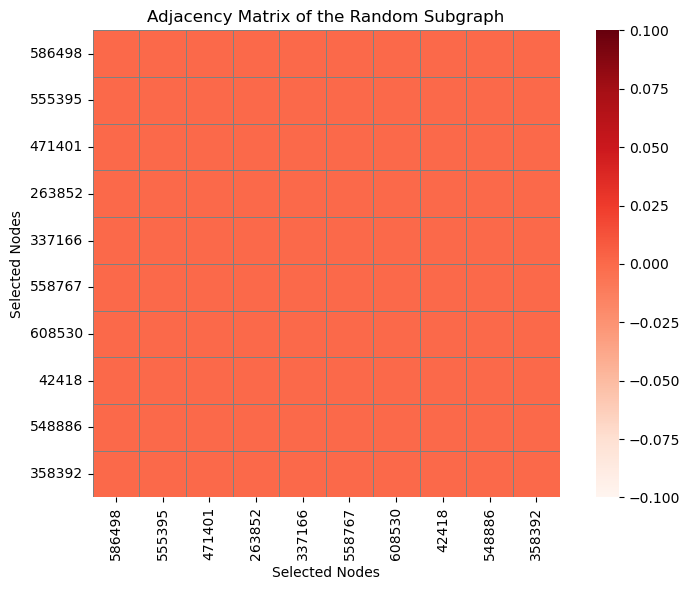

In [33]:
# Here we are converting the subgraph networkx to a pandas dataframe so we can see the heatmap that shows the connections between the selected nodes
adj_matrix = nx.to_pandas_adjacency(bt_random_subgraph)

# Here we use the heatmap 
plt.figure(figsize=(8, 6))
sns.heatmap(adj_matrix, cmap="Reds", square=True, linewidths=0.5, linecolor='gray')
plt.title("Adjacency Matrix of the Random Subgraph")
plt.xlabel("Selected Nodes")
plt.ylabel("Selected Nodes")
plt.tight_layout()
plt.show()

This matrix plot shows that the edges between the selected nodes. From this we can tell that there are no edges between the selected nodes because the adjacency matrix values are all 0.0.

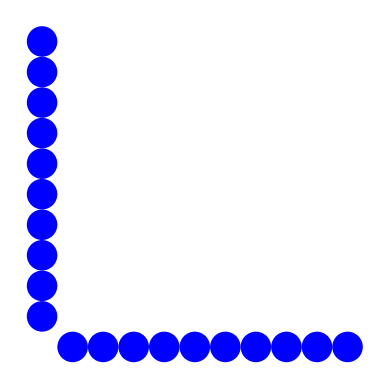

In [32]:
!pip install nxviz
import nxviz as nv

# Here we have to input the networkx in the MatrixPlot function
nv.MatrixPlot(bt_random_subgraph)
plt.show()

This is another version of the Matrix plot that also shows there are no connections between the selected nodes

**ARC PLOT**

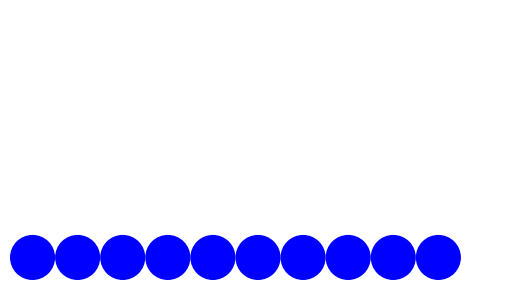

In [34]:
a = nv.ArcPlot(bt_random_subgraph)
plt.show()

Here we can see there are no connectionsn (edges) between the 10 selected nodes

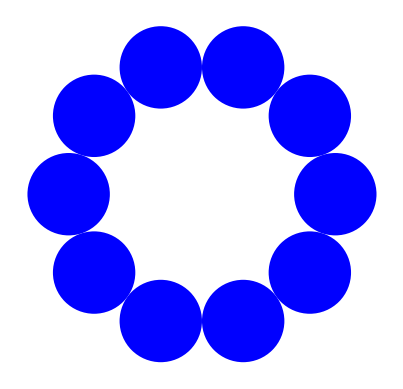

In [35]:
nv.CircosPlot(bt_random_subgraph)
plt.show()

The circos plot could show us connectivity patterns but for this selected subgraph we cannot see any edges between the selected nodes. Ultimately, from these plots, we can observe that there are no internal edges, only issolated nodes. We can infer that these nodes may be connected on the periphery but not to one another. 

## Assembling the environment

In [36]:
!pip install osmnx
#Install this package in case it is needed.
import networkx as nx
import osmnx as ox
import warnings
import matplotlib.pyplot as plt

## Challenge 2

This challenge is about OSMnx. You will explore and analyze a city's street network using the OSMnx Python library.

**2A**. Use OSMnx to download the street network of a city of your choice. You can specify the city name, BBox or a Dict.

**2B**. Calculate basic statistics for the street network, such as the number of nodes, edges, average node degree, etc.

**2C**. Use OSMnx to plot the street network. Customize the plot to make it visually appealing, including node size, edge color. See the potential options here: https://osmnx.readthedocs.io/en/stable/user-reference.html#module-osmnx.plot

**2D**. Utilize the routing capabilities of OSMnx to find the shortest path between two points in the street network. Plot the route on top of the street network.

**2E**. Calculate the centrality measures (e.g., degree centrality and betweenness_centrality) for nodes in the street network.

**2F**. Create the figure-groud from the selected city

**2G**. Create interactive maps to plot nodes, edges, nodes+edges and one of the centrality measures.

**2H**. Export the street network to a GeoPackage (.gpkg) file. Ensure that the exported file contains both node and edge attributes. Demonstrate that the new GeoPackage can be used and read in Python using any of the libraries we have seen in the class to create a simple and interactive map.

**2I**. Finally, use OSMnx to extract other urban elements (e.g., buildings, parks) and plot them.

---

**2A**. Use OSMnx to download the street network of a city of your choice. You can specify the city name, BBox or a Dict.

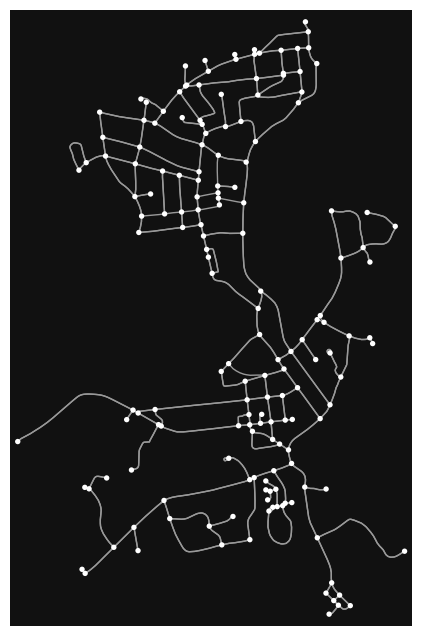

In [37]:
# download/model a street network for some city then visualize it
LPG = ox.graph_from_place("Village of Lake Placid", network_type="drive")
fig, ax = ox.plot_graph(LPG)

---

**2B**. Calculate basic statistics for the street network, such as the number of nodes, edges, average node degree, etc.

In [52]:
# What sized area does our network cover in square meters?
warnings.filterwarnings('ignore')
LPG_proj = ox.project_graph(LPG)
LP_nodes_proj = ox.graph_to_gdfs(LPG_proj, edges=False)
graph_area_LP = LP_nodes_proj.unary_union.convex_hull.area
graph_area_LP
# show some basic stats about the network
LP_stats = ox.basic_stats(LPG_proj, area=graph_area_LP, clean_int_tol=15)
print(LP_stats)
# This is a lot of information so below I will parse through these and print the requested results

{'n': 166, 'm': 425, 'k_avg': 5.120481927710843, 'edge_length_total': 58146.17799999998, 'edge_length_avg': 136.8145364705882, 'streets_per_node_avg': 2.7710843373493974, 'streets_per_node_counts': {0: 0, 1: 30, 2: 1, 3: 112, 4: 23}, 'streets_per_node_proportions': {0: 0.0, 1: 0.18072289156626506, 2: 0.006024096385542169, 3: 0.6746987951807228, 4: 0.13855421686746988}, 'intersection_count': 136, 'street_length_total': 29678.346999999983, 'street_segment_count': 219, 'street_length_avg': 135.51756621004557, 'circuity_avg': 1.0703127966684307, 'self_loop_proportion': 0.0091324200913242, 'clean_intersection_count': 123, 'node_density_km': 34.80627442300817, 'intersection_density_km': 28.5159838646332, 'edge_density_km': 12191.87848263301, 'street_density_km': 6222.847530742534, 'clean_intersection_density_km': 25.79019128933738}


In [54]:
print("Basic statistics for the street network of Lake Placid, NY, USA:")
print(f"Number of nodes: {LP_stats['n']}")  
print(f"Number of edges: {LP_stats['m']}")
print(f"Average node degree: {LP_stats['k_avg']:.2f}") 
print(f"Graph density: {LP_stats['node_density_km']:.2f}")  


Basic statistics for the street network of Lake Placid, NY, USA:
Number of nodes: 166
Number of edges: 425
Average node degree: 5.12
Graph density: 34.81


To interpret this data, we can conclude that there are 166 intersections (AKA nodes) in the street network for the Village of Lake Placid, which is a small tourist town in the Adirondacks mountain range. There are 425 edges which are street or road segments. For this street network, the average number of connections (edges) to each node is 5.12, indicating that each intersection in the network is connected to approximately 5 roads. Finally, the graph density tells us the proportion/percentage of possible connections in the street network for Lake Placid that could exist. 

---

**2C**. Use OSMnx to plot the street network. Customize the plot to make it visually appealing, including node size, edge color. See the potential options here: https://osmnx.readthedocs.io/en/stable/user-reference.html#module-osmnx.plot

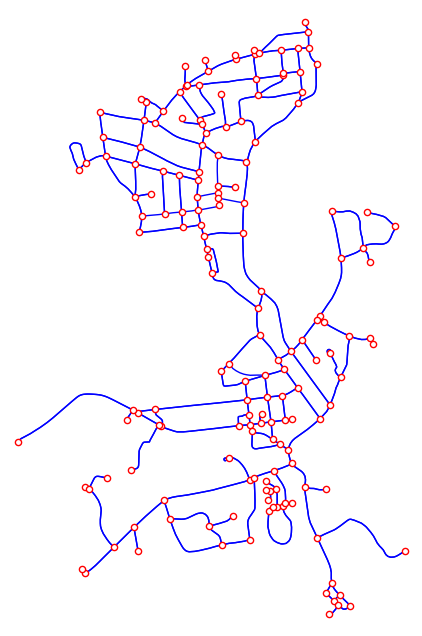

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [39]:
ox.plot.plot_graph(LPG, ax=None, figsize=(8, 8), bgcolor='white', node_color='w', node_size=20, node_alpha=None, node_edgecolor='red', node_zorder=1, edge_color='blue', edge_alpha=None, bbox=None, show=True, close=False, save=False, filepath=None, dpi=300)

---

**2D**. Utilize the routing capabilities of OSMnx to find the shortest path between two points in the street network. Plot the route on top of the street network.


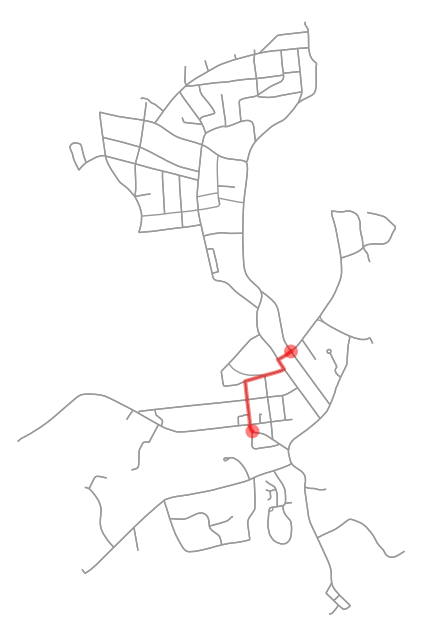

In [56]:
# To generate these points I first started with the center origin point for the Village of Lake Placid listed at this link: https://www.openstreetmap.org/relation/175841. 
# To find the destination coordinates, I navigated to the town of Lake Placid on Google Maps and selected an arbitrary point within the town boundary.
orig_lat, orig_lon = 44.2831194,-73.9828318  
dest_lat, dest_lon = 44.2785296,-73.9846813   

# This function finds the nearest nodes to the origin and destination coordinates and selects them
orig_node = ox.distance.nearest_nodes(LPG, X=orig_lon, Y=orig_lat)
dest_node = ox.distance.nearest_nodes(LPG, X=dest_lon, Y=dest_lat)

# Here I am finding the shortest path between nodes, minimizing travel time, then plotting it
route = nx.shortest_path(LPG, orig_node, dest_node, weight="length")

fig, ax = ox.plot_graph_route(LPG, route, route_linewidth=3, node_size=0, bgcolor="white")

This function shows the shortest route between the designated nodes.

**2E**. Calculate the centrality measures (e.g., degree centrality and betweenness_centrality) for nodes in the street network.

In [57]:
# Ok so here is the main degree centrality operation before the subset
LP_degree_centrality = nx.degree_centrality(LPG)
LP_bt_centrality = nx.betweenness_centrality(LPG, weight="length", normalized=True)


# Here I am creating columns for degree and betweenness centrality 
nx.set_node_attributes(LPG, LP_degree_centrality, "degree_centrality")
nx.set_node_attributes(LPG, LP_bt_centrality, "betweenness_centrality")

warnings.simplefilter('ignore', DeprecationWarning)

# Here I convert the MultiDiGraph to an undirected MultiGraph, the undirected graph does not have any inherent directionality to it
M = ox.utils_graph.get_undirected(LPG)

# Now this is converted to a diretional graph that shows the nature of the nodes interaction with a directionality
D = ox.utils_graph.get_digraph(LPG)

# This converts the networkx to a geodataframe that can be exported an used
gdf_nodes, gdf_edges = ox.graph_to_gdfs(LPG)

gdf_nodes.head()


,y,x,street_count,degree_centrality,betweenness_centrality,bc,highway,geometry
osmid,,,,,,,,
212032420,44.276682,-73.984818,3,0.036364,0.122986,0.122986,NaN,POINT (-73.98482 44.27668)
212032448,44.277690,-73.986195,3,0.036364,0.000000,0.000000,NaN,POINT (-73.98619 44.27769)
212033615,44.279335,-73.984110,3,0.036364,0.015078,0.015078,NaN,POINT (-73.98411 44.27933)
212035670,44.275414,-73.983015,3,0.036364,0.082483,0.082483,NaN,POINT (-73.98301 44.27541)
212035674,44.276233,-73.983102,3,0.036364,0.047820,0.047820,NaN,POINT (-73.98310 44.27623)


In this table you can see the measures of centrality are now stored in the geodataframe called gdf_nodes.

---

**2F**. Create the figure-ground from the selected city

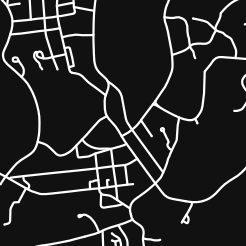

In [42]:
import osmnx as ox
from IPython.display import Image

# This generates the image display
img_folder = "images"
extension = "png"
size = 240
dpi = 40

# Th
place = "Village of Lake Placid"
point = (44.2831194,-73.9828318)
fp = f"./{img_folder}/{place}.{extension}"
fig, ax = ox.plot_figure_ground(
    point=point,
    network_type="drive", 
    filepath=fp,
    dpi=dpi,
    save=True,
    show=False,
    close=True,
)
Image(fp, height=size, width=size)

# Here I need to alter the zoom level which is controlled using the dist function

This figure gives me a better look at a specific node, which in this case, is either a notable location or a street intersection. These figure-ground diagrams have more utility within bigger street networks. For Lake Placid, the street network is so small that it is easier to interpret when you have the context of the location in something like the explore function.

---

**2G**. Create interactive maps to plot nodes, edges, nodes+edges and one of the centrality measures.

In [ ]:
warnings.filterwarnings('ignore')
# download a street network then solve a shortest-path route on it
weight = "length"
G = ox.graph_from_place("Village of Lake Placid", network_type="drive")
orig = list(LPG.nodes)[0]
dest = list(LPG.nodes)[-1]
route = ox.shortest_path(LPG, orig, dest, weight=weight)

In [ ]:
# EDGES
# explore graph edges interactively, with a simple one-liner
ox.graph_to_gdfs(LPG, nodes=False).explore()

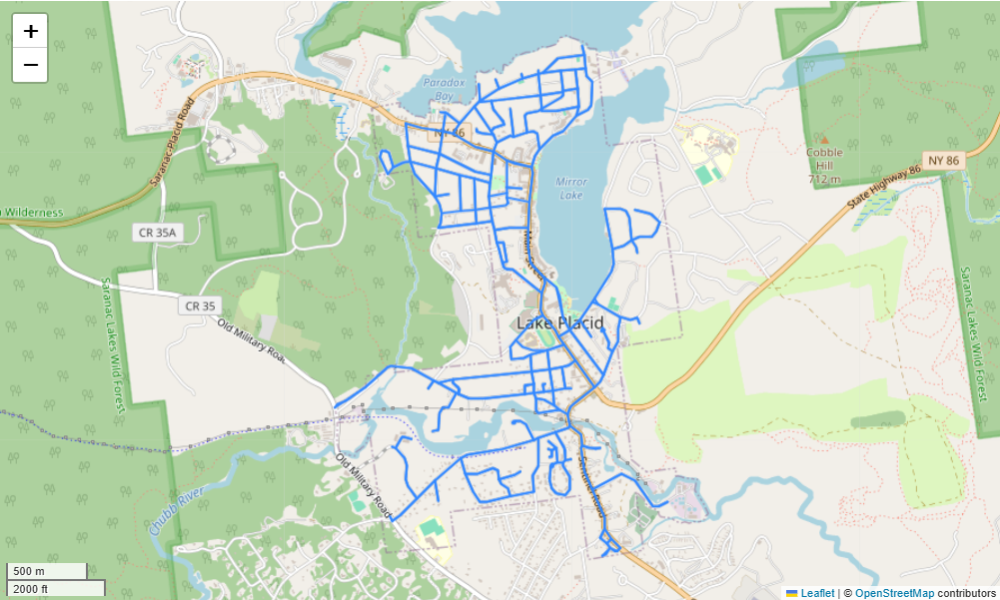
Caption: Here we can observe the street network (edges) for the Village of Lake Placid

In [ ]:
# NODES
# explore graph nodes interactively, with different basemap tiles
nodes = ox.graph_to_gdfs(LPG, edges=False)
nodes.explore(tiles="cartodbpositron", marker_kwds={"radius": 8})

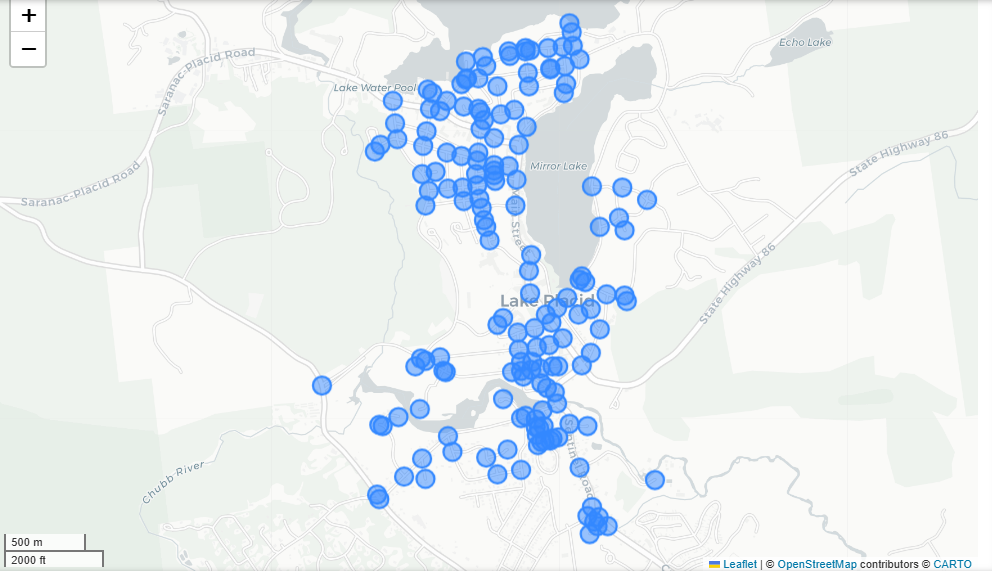
Caption: Here we can observe the intersections of streets or notable locations (stored as nodes) for the Village of Lake Placid

In [ ]:
# NODES AND EDGES
# Here are the nodes and edges together in a single map
nodes, edges = ox.graph_to_gdfs(LPG)
m = edges.explore(color="blue")
nodes.explore(m=m, color="red", marker_kwds={"radius": 6})

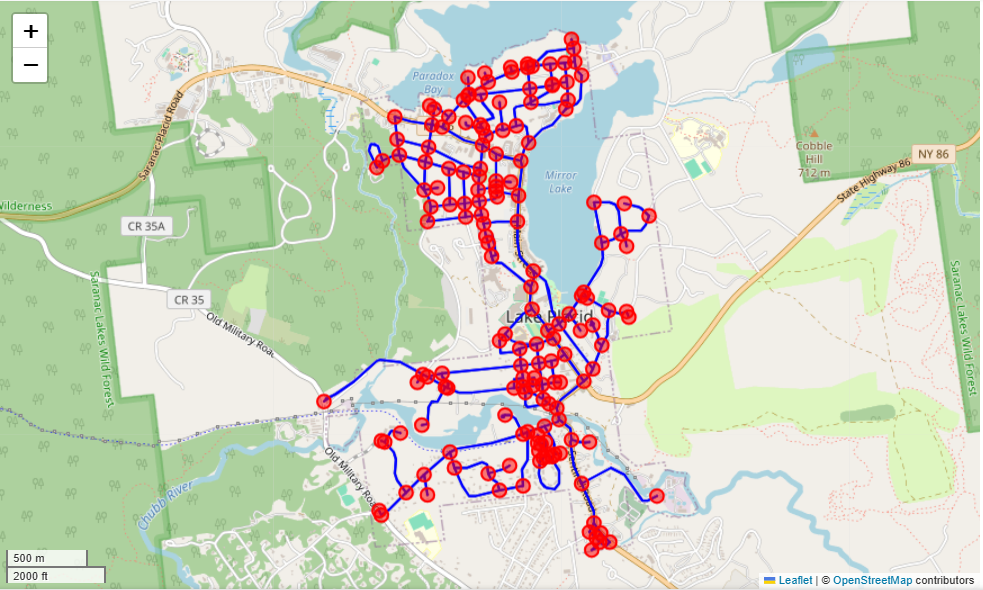
Caption: Here we can observe the street intersections/notable locations (stored as nodes) and the street network (edges)for the Village of Lake Placid together.

In [ ]:
# CENTRALITY MEASURES
# Here I explore graph nodes interactively, colored by betweenness centrality
nx.set_node_attributes(LPG, LP_bt_centrality, name="bc")
nodes = ox.graph_to_gdfs(LPG, edges=False)
nodes.explore(column="bc", marker_kwds={"radius": 8})

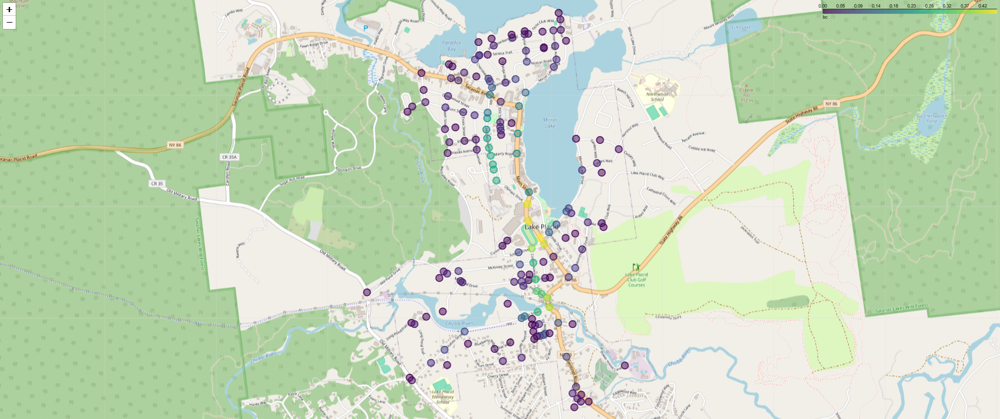
Caption: The betweenness centrality between nodes in the village of Lake Placid, where the closer the colour to yellow the greater the connectivity to other nodes in the network. In this case, nodes along the high street in the town have the highest betweenness centrality measure. To simplify, these nodes sit at more central locations on the street network and therefore, have more edges.

---

**2H**. Export the street network to a GeoPackage (.gpkg) file. Ensure that the exported file contains both node and edge attributes. Demonstrate that the new GeoPackage can be used and read in Python using any of the libraries we have seen in the class to create a simple and interactive map.


In [ ]:
# By saving this to a geopackage it can be stored and replicatedwithout having to run all the operations before 
ox.save_graph_geopackage(LPG, filepath="lakeplacid_ntwk.gpkg")

import geopandas as gpd

# Step 4: Load the GeoPackage
lpntwk_gdf = gpd.read_file("lakeplacid_ntwk.gpkg")

# Here I use the explore function to show that it can be reproduced
lpntwk_gdf.explore()

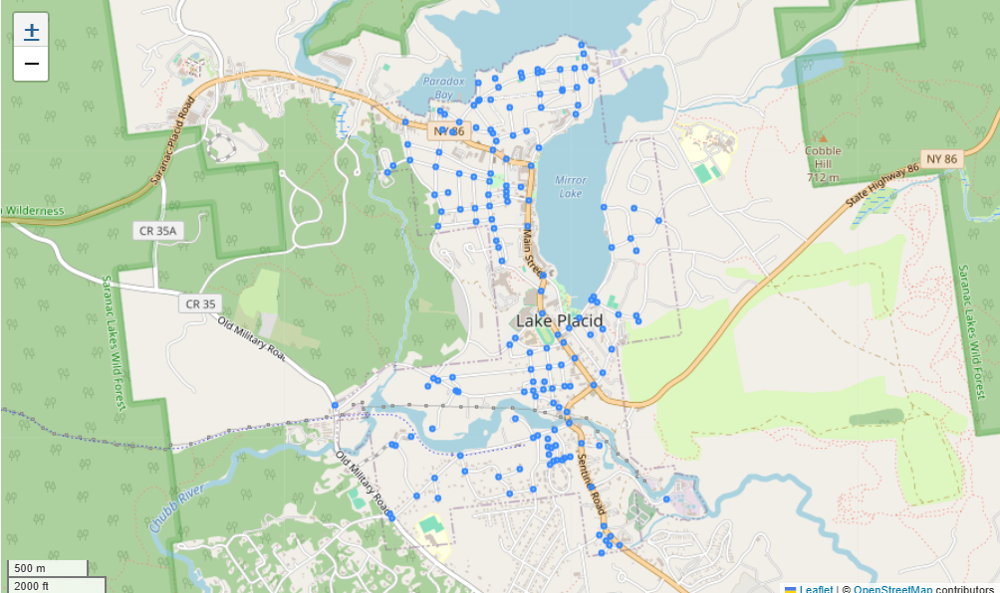
Caption: Here you can see that the package has been effectively stored, saved, and uploaded back into the environment

---

2I. Finally, use OSMnx to extract other urban elements (e.g., buildings, parks) and plot them.

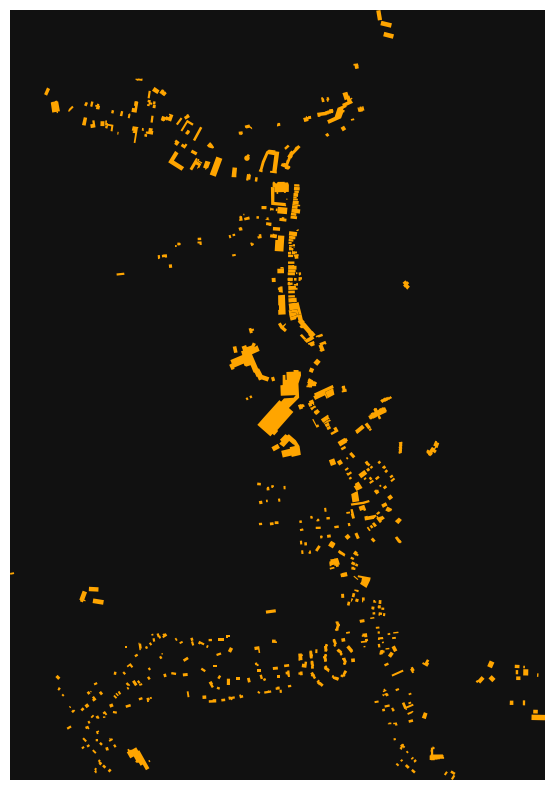

In [67]:
# BUILDINGS 
# Here I am pulling all the building footprints but since it is a smaller, less densely populated area I do not need to specify a neighborhoodget all building footprints in some neighborhood
place = "Village of Lake Placid"
tags = {"building": True}
lp_gdf = ox.features_from_place(place, tags)
lp_gdf.shape

warnings.simplefilter('ignore', DeprecationWarning)

fig, ax = ox.plot_footprints(lp_gdf, figsize=(12, 10))

Caption: Here we can see the building footprints for the Village of Lake Placid.

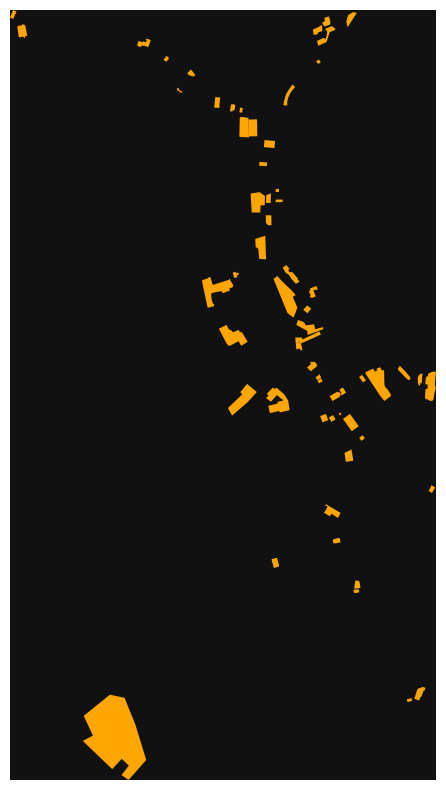

In [68]:
# AMENITIES
# Here we can see all the useful and important facilities for residents and vistors (ex. pharmacies, schools, toilets etc.)
place = "Village of Lake Placid"
tags = {"amenity": True}
lp_gdf = ox.features_from_place(place, tags)
lp_gdf.shape

warnings.simplefilter('ignore', DeprecationWarning)

fig, ax = ox.plot_footprints(lp_gdf, figsize=(12, 10))

Caption: Here are all the amenities for the Village of Lake Placid

Consulted this link for other key identifiers in Open Street Map: https://wiki.openstreetmap.org/wiki/Map_features

---

# Lab No. 6: Geodemographics

# Challenge 1: Geodemographic Classification

In this challenge, you will replicate the process of creating a geodemographic classification using the k-means clustering algorithm. Please select any city in the UK except London, Liverpool, or Glasgow. The main goal is to generate a meaningful and informative classification that captures the diversity of areas in your dataset using the census data ( For England, you can try to use the 2021 or 2011 census, and for Scotland, you need to use the 2011 census data) 

1. Define the main goal for the geodemographic classification (marketing, retail and service planning). 
2. Look for census data from the selected city for which you would like to generate the geodemographic classification.
3. The census data at the Output Area OA level. Select multiple topics of at least four topics (socio-demographics, economics, health, and so on). Describe your topic selection accordingly based on the goal of your geodemographic classification. For example, if your geodemographics are related to marketing, Economic variables might be the appropriate selection. 
4. Identify the variables that will be crucial for effectively segmenting neighbourhoods. Evaluate how this choice may impact the classification results, including a DEA analysis.
5. Prepare, adjust or clean the dataset addressing any missing values or outliers that could distort the clustering results.
6. Include standardisation between areas and variables. Make an appropriate analysis and adjust the variable selection accordingly for any multicollinearity.
7. Utilize the k-means clustering algorithm to create a classification based on the selected variables.
8. Define the optimum number of clusters (i.e., using the Elblow method). Experiment with different values of k.
9. Evaluate your cluster groups (e.g., using PCA) and interpret your cluster centres. Describe your results and repeat the process to adjust the variable selection and cluster groups to provide more meaningful results for your geodemographic goal. Interpret the characteristics of each cluster. What demographic patterns or similarities are prevalent within each group?
10. Map the final cluster groups
11. Finish the analysis by naming the final clusters and plotting a final map that includes the census values and the provided names.
12. Finally, acknowledge the subjective nature of classification and make analytical decisions to produce an optimum classification for your specific purpose. Reflect on the challenges and insights gained during the classification process. Ensure you document your analytical decisions and the rationale behind any important decision. Once your geodemographics are constructed, describe the potential use cases for the geodemographic classification you have built based on your initial goal.

---

**1**. Define the main goal for the geodemographic classification (marketing, retail and service planning). 

The aim of this geodemographic classification is to identify and cluster areas within Stirling, Scotland based on indicators of socioeconomic disadvantage related to education and employment. By analyzing variables such as educational attainment (possession of education qualifications), levels of unemployment, long-term sickness or disability, and economic inactivity due to disability or caring responsibilities, the goal is to uncover spatial patterns of deprivation. This geodemographic classification will seek to sort Stirling into clusters, looking for high-deprivation zones, underemployment areas, and educationally dis/advantaged zones. This classification will give a deeper understanding of social inequality in Stirling, showing parts of the city which could be targeted for policy intervention.

---

**2**. Look for census data from the selected city for which you would like to generate the geodemographic classification.

Uploading the data and merging the correct datasets

In [ ]:
# This code cell DOES NOT need to be run as there is already a file called merged_census_data.csv 
# I have included the code to demonstrate how this can be done
# Here the CENSUS data is merged to itself
import pandas as pd
import os

csv_directory = "census_raw_data"

# We need a list of all CSV files in the folder
csv_files = [file for file in os.listdir(csv_directory) if file.endswith(".csv")]

# An empty DataFrame to store the merged data
merged_data = pd.DataFrame()

# Loop through each CSV file
for csv_file in csv_files:
    csv_path = os.path.join(csv_directory, csv_file) # We create a consistent path
    df_csv = pd.read_csv(csv_path, low_memory=False) #read each file
    # Concatenate/Merge all columns, there is a pitfall here, you will get a duplicate oa_code from all csv files.
    merged_data = pd.concat([merged_data, df_csv], axis=1)

# Save the merged dataset. You might want to do some pre-processing.
merged_data.to_csv("census_raw_data/merged_census_data.csv", index=False)
# Be aware of the mixted dtype you are importing we unfortunatly have to deal with that later.
# eventually you can avoid this to define the dtype on import method.

**Pull Data Here**
- lab_6/merged_census_data.csv
- lab_6/stirling_oa.shp
- lab_6/stirling_oa.shx
- lab_6/stirling_oa.cpg
- lab_6/stirling_oa.dbf
- lab_6/stirling_oa.prj

In [121]:
# Here the gdf for Stirling and the merged census data is being uploaded
import pandas as pd
import geopandas as gpd
stirling_path = "lab_6/stirling_oa.shp"
stirling_gdf = gpd.read_file(stirling_path)

csv_path = "lab_6/merged_census_data.csv"
csv_data = pd.read_csv(csv_path, low_memory=False)
csv_data.head()

,oa_code,All people,0 to 4,5 to 7,8 to 9,10 to 14,15,16 to 17,18 to 19,20 to 24,...,Solid fuel (for example wood coal) central heating.15,Other central heating.15,Two or more types of central heating.15,oa_code.159,All people aged 16 and over.31,All people aged 16 and over: No qualifications.15,All people aged 16 and over: Level 1.15,All people aged 16 and over: Level 2.15,All people aged 16 and over: Level 3.15,All people aged 16 and over: Level 4 and above.15
0,S92000003,"5,295,403","292,821","164,246","105,371","291,615","62,278","126,266","142,282","363,940",...,26209,16608,60510,S92000003,"4,379,072","1,173,116","1,010,875","627,423","424,996","1,142,662"
1,S00088956,230,28,22,6,13,2,4,6,10,...,0,1,0,S00088956,159,15,33,16,23,72
2,S00088957,66,2,1,1,4,-,3,2,4,...,0,1,3,S00088957,58,12,16,8,1,21
3,S00088958,90,3,8,7,12,-,2,3,2,...,0,0,0,S00088958,60,3,8,4,2,43
4,S00088959,83,8,7,3,2,-,1,1,4,...,1,1,0,S00088959,63,6,14,8,5,30


Upon inspection, the formatting for the output areas are formatted slightly differently:
- str_gdf['Output_Are'] = S00...
- csv_data['oa_code'] = S17...

So we need to figure out how to match these to one another

In [139]:
# First cleaning that needs to be done is the mismatch of the output area variables between the two daatasets
# Having an issue with the unmatched columns, attempted to solve by removing the 'S00' prefix on the output areas
# After doing some research I found the fuzzy merge/rapid merge technique that will approximate matching values

!pip install rapidfuzz
from rapidfuzz import process, fuzz

# Here I'm making a dict that will comb through the output area codes and find the cloest matches
oa_matches = {
    code: process.extractOne(code, csv_data['oa_code'], scorer=fuzz.partial_ratio)[0]
    for code in stirling_gdf['Output_Are']
}

# Here I am creating a column for the closely matched output area codes
stirling_gdf['matched_oa_code'] = stirling_gdf['Output_Are'].map(oa_matches)

# Now I can initiate the merge using the fuzzy-matched codes 
stirling_merged = stirling_gdf.merge(csv_data, left_on='matched_oa_code', right_on='oa_code', how='left')


C:\Users\norab\miniforge3\envs\ua\Lib\threading.py:986: ResourceWarning: unclosed file <_io.BufferedWriter name=5>
  del self._target, self._args, self._kwargs
C:\Users\norab\miniforge3\envs\ua\Lib\threading.py:986: ResourceWarning: unclosed file <_io.BufferedReader name=6>
  del self._target, self._args, self._kwargs
C:\Users\norab\miniforge3\envs\ua\Lib\threading.py:986: ResourceWarning: unclosed file <_io.BufferedReader name=7>
  del self._target, self._args, self._kwargs


Pykes, K., 2025. *Fuzzy String Matching in Python Tutorial*. [Online] 
Available at: https://www.datacamp.com/tutorial/fuzzy-string-python?dc_referrer=https%3A%2F%2Fwww.google.com%2F
[Accessed 2 April 2025].



In [138]:
print("Total rows in stirling_gdf:", len(stirling_gdf))
print("Total rows in stirling_merged:", len(stirling_merged))
stirling_merged[['Output_Are', 'matched_oa_code', 'oa_code']].head(10)


Total rows in stirling_gdf: 750
Total rows in stirling_merged: 750


,Output_Are,matched_oa_code,oa_code
0,S00178631,S00107863,S00107863
1,S00178632,S00107863,S00107863
2,S00178633,S00107863,S00107863
3,S00178634,S00107863,S00107863
4,S00178635,S00107863,S00107863
5,S00178636,S00107863,S00107863
6,S00178637,S00107863,S00107863
7,S00178638,S00107863,S00107863
8,S00178639,S00107863,S00107863
9,S00178640,S00107864,S00107864


In [140]:
stirling_merged.head()

,Local_Auth,Local_Au_1,Output_Are,Master_Pos,Easting,Northing,geometry,Output_Are_cleaned,matched_oa_code,oa_code,...,Other central heating.15,Two or more types of central heating.15,oa_code.159,All people aged 16 and over.31,All people aged 16 and over: No qualifications.15,All people aged 16 and over: Level 1.15,All people aged 16 and over: Level 2.15,All people aged 16 and over: Level 3.15,All people aged 16 and over: Level 4 and above.15,oa_code_cleaned
0,S12000030,Stirling Council,S00178631,FK21 8ST,258554,732707,"MULTIPOLYGON (((-471371.161 7655867.505, -4713...",S178631,S00107863,S00107863,...,0,1,S00107863,100,23,34,10,7,26,S00107863
1,S12000030,Stirling Council,S00178632,FK20 8QS,241322,726003,"POLYGON ((-515926.562 7653190.910, -515940.917...",S178632,S00107863,S00107863,...,0,1,S00107863,100,23,34,10,7,26,S00107863
2,S12000030,Stirling Council,S00178633,FK21 8TN,257098,733396,"POLYGON ((-480401.205 7651602.681, -480252.151...",S178633,S00107863,S00107863,...,0,1,S00107863,100,23,34,10,7,26,S00107863
3,S12000030,Stirling Council,S00178634,FK21 8RE,253145,729398,"POLYGON ((-481410.877 7653951.833, -481421.253...",S178634,S00107863,S00107863,...,0,1,S00107863,100,23,34,10,7,26,S00107863
4,S12000030,Stirling Council,S00178635,FK20 8RQ,232977,730497,"POLYGON ((-520829.748 7650894.447, -520852.468...",S178635,S00107863,S00107863,...,0,1,S00107863,100,23,34,10,7,26,S00107863


In [142]:
stirling_merged.head()

,Local_Auth,Local_Au_1,Output_Are,Master_Pos,Easting,Northing,geometry,Output_Are_cleaned,matched_oa_code,oa_code,...,Other central heating.15,Two or more types of central heating.15,oa_code.159,All people aged 16 and over.31,All people aged 16 and over: No qualifications.15,All people aged 16 and over: Level 1.15,All people aged 16 and over: Level 2.15,All people aged 16 and over: Level 3.15,All people aged 16 and over: Level 4 and above.15,oa_code_cleaned
0,S12000030,Stirling Council,S00178631,FK21 8ST,258554,732707,"MULTIPOLYGON (((-471371.161 7655867.505, -4713...",S178631,S00107863,S00107863,...,0,1,S00107863,100,23,34,10,7,26,S00107863
1,S12000030,Stirling Council,S00178632,FK20 8QS,241322,726003,"POLYGON ((-515926.562 7653190.910, -515940.917...",S178632,S00107863,S00107863,...,0,1,S00107863,100,23,34,10,7,26,S00107863
2,S12000030,Stirling Council,S00178633,FK21 8TN,257098,733396,"POLYGON ((-480401.205 7651602.681, -480252.151...",S178633,S00107863,S00107863,...,0,1,S00107863,100,23,34,10,7,26,S00107863
3,S12000030,Stirling Council,S00178634,FK21 8RE,253145,729398,"POLYGON ((-481410.877 7653951.833, -481421.253...",S178634,S00107863,S00107863,...,0,1,S00107863,100,23,34,10,7,26,S00107863
4,S12000030,Stirling Council,S00178635,FK20 8RQ,232977,730497,"POLYGON ((-520829.748 7650894.447, -520852.468...",S178635,S00107863,S00107863,...,0,1,S00107863,100,23,34,10,7,26,S00107863


In [ ]:
list(str_merged_data.columns)
#This is just a small sample of the number of potential variables you have available in the census
# Using some ML techniques, you could include hundreds of these to make your geodemographics
# more meaningful. For this academic exercise, only 386 variables will be loaded,
# and then filtered to be included in the cluster

---

**3**. The census data at the Output Area OA level. Select multiple topics of at least four topics (socio-demographics, economics, health, and so on). Describe your topic selection accordingly based on the goal of your geodemographic classification. For example, if your geodemographics are related to marketing, Economic variables might be the appropriate selection. 

For this dataset, I am assessing deprivation and accessibility in employment. This classification groups areas based on urbanization levels, population density, and transportation accessibility. It is useful for city planning, transport policy, infrastructure development, and service allocation. This geodemographic classification will pull from the (1) household composition, (2) economic activity, (3) age structure, (4) socio-demographics, and (5) industry.

---

**4**. Identify the variables that will be crucial for effectively segmenting neighbourhoods. Evaluate how this choice may impact the classification results, including a DEA analysis.

In [143]:
# summary statistics of tenure of household
stirling_merged['Economically active: Unemployed.8'].describe()


count     750
unique     16
top         4
freq      101
Name: Economically active: Unemployed.8, dtype: object

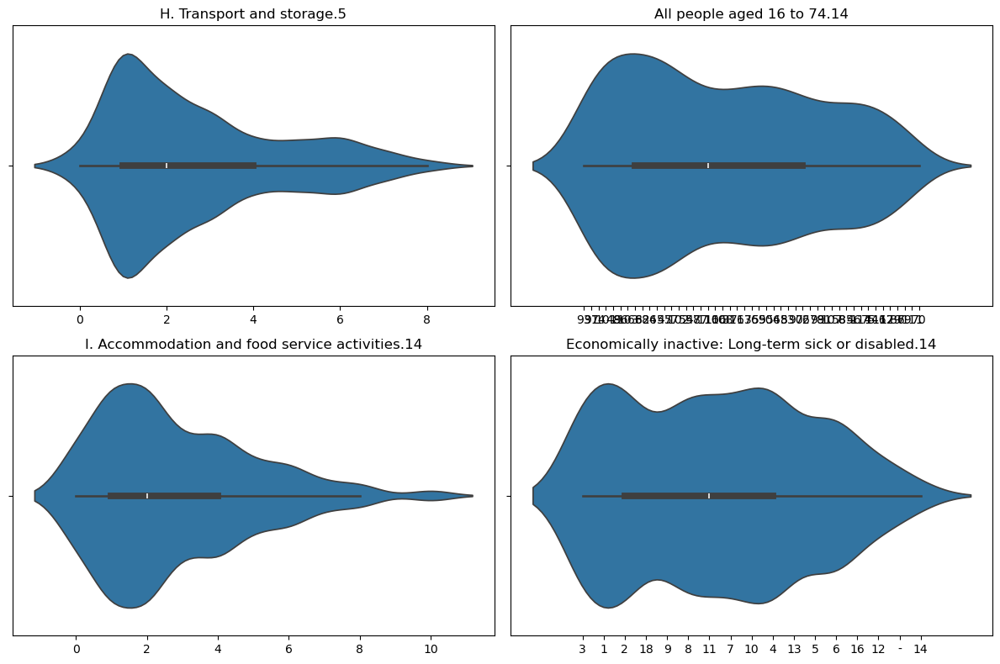

In [148]:
import seaborn as sns
import matplotlib.pyplot as plt

attributes_to_plot = ['H. Transport and storage.5',
                      'All people aged 16 to 74.14',
                      'I. Accommodation and food service activities.14',
                      'Economically inactive: Long-term sick or disabled.14']

plt.figure(figsize=(12, 8))

for i, attribute in enumerate(attributes_to_plot, 1):
    plt.subplot(2, 2, i)
    sns.violinplot(x=stirling_merged[attribute])
    plt.title(attribute)
    plt.xlabel('')
    plt.ylabel('')

plt.tight_layout()
plt.show()


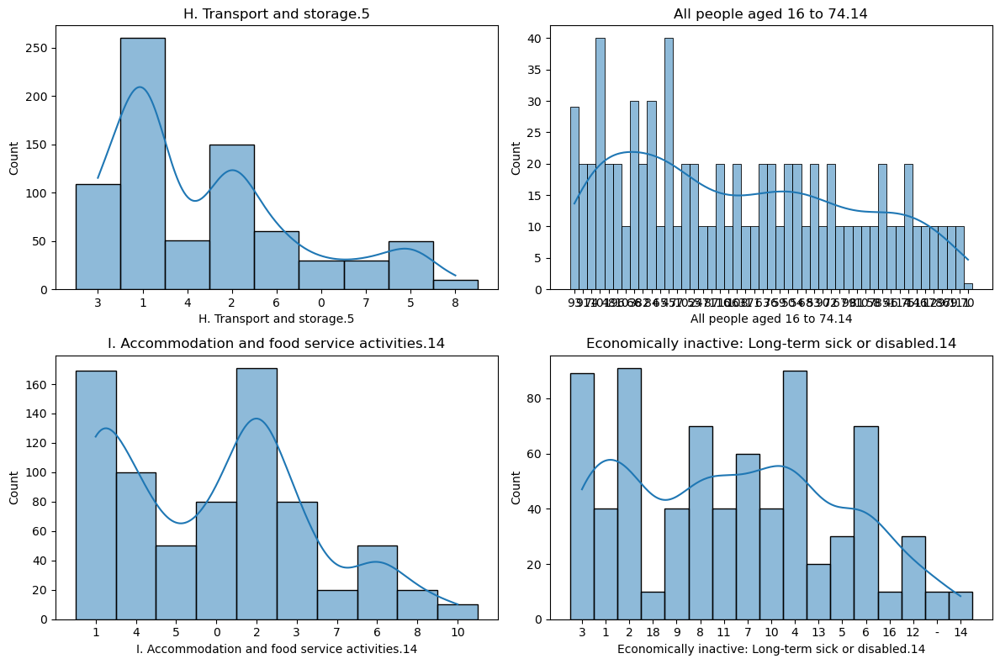

In [147]:
import matplotlib.pyplot as plt

attributes_to_plot = ['H. Transport and storage.5',
                      'All people aged 16 to 74.14',
                      'I. Accommodation and food service activities.14',
                      'Economically inactive: Long-term sick or disabled.14']

plt.figure(figsize=(12, 8))

for i, attribute in enumerate(attributes_to_plot, 1):
    plt.subplot(2, 2, i)
    sns.histplot(stirling_merged[attribute].astype(str), kde=True)
    plt.title(attribute)

plt.tight_layout()
plt.show()

---

**5**. Prepare, adjust or clean the dataset addressing any missing values or outliers that could distort the clustering results.

In [ ]:
# Different from the lab workflow, I need to first consult the columns list to figure out how they are denoted because it does not match the labels attached in the metadata
# Print all column names
print(str_merged_data.columns.tolist())  

---

**6**. Include standardisation between areas and variables. Make an appropriate analysis and adjust the variable selection accordingly for any multicollinearity.


In [149]:
import pandas as pd
def calculate_percentages(stirling_merged, total_columns, value_columns):

    result_df = pd.DataFrame()

    for total_col, value_col in zip(total_columns, value_columns):
        percentage_col_name = f"{value_col}_percentage"

        if total_col not in stirling_merged.columns:
            raise ValueError(f"Total column '{total_col}' not found in the DataFrame.")
        # The data have several empty values, so you need to process them, forcing them to be a numeric or NaN value
        stirling_merged[value_col] = pd.to_numeric(stirling_merged[value_col], errors='coerce')
        stirling_merged[total_col] = pd.to_numeric(stirling_merged[total_col], errors='coerce')
        
        result_df[percentage_col_name] = (stirling_merged[value_col] / stirling_merged[total_col]) * 100

    return result_df

# List of the corresponding totals.
total_cols = ['All people aged 16 and over',
              'All people aged 16 and over',
              'All people aged 16 to 74','All people aged 16 to 74',
              'All people aged 16 and over.1', 'All people aged 16 and over.1',
              'All households','All households',
              'All households', 'All households',
              'All people aged 16 and over','All people aged 16 to 74',
              'All people aged 16 to 74', 'All people aged 16 to 74',
              'All people aged 16 to 74', 'All people aged 16 to 74',
              'All people aged 16 to 74 in employment','All people aged 16 to 74 in employment',
              'All people aged 16 to 74 in employment' ]
# List of the corresponding values. 
value_cols = ['All people aged 16 and over: Level 4 and above',
              'All people aged 16 and over: No qualifications',
              'Unemployed people aged 16 to 74: Aged 16 to 24',
              'Unemployed people aged 16 to 74: Never worked',
              'Single (never married or never registered a same-sex civil partnership)',
              'Married',
              'One family only: Married or same-sex civil partnership couple: No children',
              'Other households: All full-time students',
              'In a registered same-sex civil partnership.15',
              'One family only: Married or same-sex civil partnership couple: With dependent children.12',
              'Widowed or surviving partner from a same-sex civil partnership.15',
              'Economically inactive: Long-term sick or disabled',
              'Economically active: Employee: Full-time',
              'Economically active: Unemployed',
              'Economically active: Full-time student',
              'Economically inactive: Looking after home or family.11',
              'F. Construction', 'Q. Human health and social work activities', 'P. Education']

# Later we migth need to rename those columns., for now is ok...
str_result = calculate_percentages(stirling_merged, total_cols, value_cols)

# Likely you could also do all this in Excel :D
# but what's important is you are aware of the correct total as dominator, census data can be very tricky

In [155]:
str_result.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 750 entries, 0 to 749
Data columns (total 19 columns):
 #   Column                                                                                                Non-Null Count  Dtype  
---  ------                                                                                                --------------  -----  
 0   All people aged 16 and over: Level 4 and above_percentage                                             750 non-null    float64
 1   All people aged 16 and over: No qualifications_percentage                                             750 non-null    float64
 2   Unemployed people aged 16 to 74: Aged 16 to 24_percentage                                             580 non-null    float64
 3   Unemployed people aged 16 to 74: Never worked_percentage                                              400 non-null    float64
 4   Single (never married or never registered a same-sex civil partnership)_percentage                    75

In [150]:
str_result.head()

,All people aged 16 and over: Level 4 and above_percentage,All people aged 16 and over: No qualifications_percentage,Unemployed people aged 16 to 74: Aged 16 to 24_percentage,Unemployed people aged 16 to 74: Never worked_percentage,Single (never married or never registered a same-sex civil partnership)_percentage,Married_percentage,One family only: Married or same-sex civil partnership couple: No children_percentage,Other households: All full-time students_percentage,In a registered same-sex civil partnership.15_percentage,One family only: Married or same-sex civil partnership couple: With dependent children.12_percentage,Widowed or surviving partner from a same-sex civil partnership.15_percentage,Economically inactive: Long-term sick or disabled_percentage,Economically active: Employee: Full-time_percentage,Economically active: Unemployed_percentage,Economically active: Full-time student_percentage,Economically inactive: Looking after home or family.11_percentage,F. Construction_percentage,Q. Human health and social work activities_percentage,P. Education_percentage
0,26.0,23.0,NaN,NaN,21.0,62.0,29.166667,NaN,6.25,18.75,5.0,3.225806,41.935484,2.150538,2.150538,2.150538,3.225806,8.064516,9.677419
1,26.0,23.0,NaN,NaN,21.0,62.0,29.166667,NaN,6.25,18.75,5.0,3.225806,41.935484,2.150538,2.150538,2.150538,3.225806,8.064516,9.677419
2,26.0,23.0,NaN,NaN,21.0,62.0,29.166667,NaN,6.25,18.75,5.0,3.225806,41.935484,2.150538,2.150538,2.150538,3.225806,8.064516,9.677419
3,26.0,23.0,NaN,NaN,21.0,62.0,29.166667,NaN,6.25,18.75,5.0,3.225806,41.935484,2.150538,2.150538,2.150538,3.225806,8.064516,9.677419
4,26.0,23.0,NaN,NaN,21.0,62.0,29.166667,NaN,6.25,18.75,5.0,3.225806,41.935484,2.150538,2.150538,2.150538,3.225806,8.064516,9.677419


In [151]:
# Concatenate the resulting tables.
concatenated_df = pd.concat([stirling_merged, str_result], axis=1, ignore_index=False)
concatenated_df.head()

,Local_Auth,Local_Au_1,Output_Are,Master_Pos,Easting,Northing,geometry,Output_Are_cleaned,matched_oa_code,oa_code,...,One family only: Married or same-sex civil partnership couple: With dependent children.12_percentage,Widowed or surviving partner from a same-sex civil partnership.15_percentage,Economically inactive: Long-term sick or disabled_percentage,Economically active: Employee: Full-time_percentage,Economically active: Unemployed_percentage,Economically active: Full-time student_percentage,Economically inactive: Looking after home or family.11_percentage,F. Construction_percentage,Q. Human health and social work activities_percentage,P. Education_percentage
0,S12000030,Stirling Council,S00178631,FK21 8ST,258554,732707,"MULTIPOLYGON (((-471371.161 7655867.505, -4713...",S178631,S00107863,S00107863,...,18.75,5.0,3.225806,41.935484,2.150538,2.150538,2.150538,3.225806,8.064516,9.677419
1,S12000030,Stirling Council,S00178632,FK20 8QS,241322,726003,"POLYGON ((-515926.562 7653190.910, -515940.917...",S178632,S00107863,S00107863,...,18.75,5.0,3.225806,41.935484,2.150538,2.150538,2.150538,3.225806,8.064516,9.677419
2,S12000030,Stirling Council,S00178633,FK21 8TN,257098,733396,"POLYGON ((-480401.205 7651602.681, -480252.151...",S178633,S00107863,S00107863,...,18.75,5.0,3.225806,41.935484,2.150538,2.150538,2.150538,3.225806,8.064516,9.677419
3,S12000030,Stirling Council,S00178634,FK21 8RE,253145,729398,"POLYGON ((-481410.877 7653951.833, -481421.253...",S178634,S00107863,S00107863,...,18.75,5.0,3.225806,41.935484,2.150538,2.150538,2.150538,3.225806,8.064516,9.677419
4,S12000030,Stirling Council,S00178635,FK20 8RQ,232977,730497,"POLYGON ((-520829.748 7650894.447, -520852.468...",S178635,S00107863,S00107863,...,18.75,5.0,3.225806,41.935484,2.150538,2.150538,2.150538,3.225806,8.064516,9.677419


In [156]:
# Subsetting the attributes we need, we dont need the total for now.
keep_cols= [
    'matched_oa_code',
    'geometry',
    'All people aged 16 and over: Level 4 and above_percentage',
     'All people aged 16 and over: No qualifications_percentage',
     'Unemployed people aged 16 to 74: Aged 16 to 24_percentage',
     'Unemployed people aged 16 to 74: Never worked_percentage',
     'Single (never married or never registered a same-sex civil partnership)_percentage',
     'Married_percentage',
     'One family only: Married or same-sex civil partnership couple: No children_percentage',
     'Other households: All full-time students_percentage',
     'In a registered same-sex civil partnership.15_percentage',
     'One family only: Married or same-sex civil partnership couple: With dependent children.12_percentage',
     'Widowed or surviving partner from a same-sex civil partnership.15_percentage',
     'Economically inactive: Long-term sick or disabled_percentage',
     'Economically active: Employee: Full-time_percentage',
     'Economically active: Unemployed_percentage',
     'Economically active: Full-time student_percentage',
     'Economically inactive: Looking after home or family.11_percentage',
     'F. Construction', 'Q. Human health and social work activities', 'P. Education'
]

stirling_census_data = concatenated_df[keep_cols]

In [158]:
stirling_census_data.head()

,matched_oa_code,geometry,All people aged 16 and over: Level 4 and above_percentage,All people aged 16 and over: No qualifications_percentage,Unemployed people aged 16 to 74: Aged 16 to 24_percentage,Unemployed people aged 16 to 74: Never worked_percentage,Single (never married or never registered a same-sex civil partnership)_percentage,Married_percentage,One family only: Married or same-sex civil partnership couple: No children_percentage,Other households: All full-time students_percentage,...,One family only: Married or same-sex civil partnership couple: With dependent children.12_percentage,Widowed or surviving partner from a same-sex civil partnership.15_percentage,Economically inactive: Long-term sick or disabled_percentage,Economically active: Employee: Full-time_percentage,Economically active: Unemployed_percentage,Economically active: Full-time student_percentage,Economically inactive: Looking after home or family.11_percentage,F. Construction,Q. Human health and social work activities,P. Education
0,S00107863,"MULTIPOLYGON (((-471371.161 7655867.505, -4713...",26.0,23.0,NaN,NaN,21.0,62.0,29.166667,NaN,...,18.75,5.0,3.225806,41.935484,2.150538,2.150538,2.150538,2,5,6
1,S00107863,"POLYGON ((-515926.562 7653190.910, -515940.917...",26.0,23.0,NaN,NaN,21.0,62.0,29.166667,NaN,...,18.75,5.0,3.225806,41.935484,2.150538,2.150538,2.150538,2,5,6
2,S00107863,"POLYGON ((-480401.205 7651602.681, -480252.151...",26.0,23.0,NaN,NaN,21.0,62.0,29.166667,NaN,...,18.75,5.0,3.225806,41.935484,2.150538,2.150538,2.150538,2,5,6
3,S00107863,"POLYGON ((-481410.877 7653951.833, -481421.253...",26.0,23.0,NaN,NaN,21.0,62.0,29.166667,NaN,...,18.75,5.0,3.225806,41.935484,2.150538,2.150538,2.150538,2,5,6
4,S00107863,"POLYGON ((-520829.748 7650894.447, -520852.468...",26.0,23.0,NaN,NaN,21.0,62.0,29.166667,NaN,...,18.75,5.0,3.225806,41.935484,2.150538,2.150538,2.150538,2,5,6


Here I can see there are now only 21 columns which is much easier to manipulate

In [159]:
# For more easy manipulation we define short column names
short_column_names = {
    'All people aged 16 and over: Level 4 and above_percentage': 'Edu_Level4',
    'All people aged 16 and over: No qualifications_percentage': 'Edu_Level0',
    'Unemployed people aged 16 to 74: Aged 16 to 24_percentage': 'unemp_16to24',
    'Unemployed people aged 16 to 74: Never worked_percentage': 'unemp_never',
    'Single (never married or never registered a same-sex civil partnership)_percentage': 'Single',
    'Married_percentage': 'Married',
    'One family only: Married or same-sex civil partnership couple: No children_percentage': 'HH_No_Children',
    'Other households: All full-time students_percentage': 'Family_Students',
    'In a registered same-sex civil partnership.15_percentage': 'HH_married_SS',
    'One family only: Married or same-sex civil partnership couple: With dependent children.12_percentage': 'HH_w_Children',
    'Widowed or surviving partner from a same-sex civil partnership.15_percentage': 'Widowed',
    'Economically inactive: Long-term sick or disabled_percentage': 'EA_sick',
    'Economically active: Employee: Full-time_percentage': 'EA_fulltime',
    'Economically active: Unemployed_percentage': 'EA_unemp',
    'Economically active: Full-time student_percentage': 'EA_student',
    'Economically inactive: Looking after home or family.11_percentage': 'EA_carer',
    'F. Construction_percentage': 'Construction',
    'Q. Human health and social work activities': 'Health',
    'P. Education_percentage': 'Education'
}

stirling_census_data = stirling_census_data.rename(columns=short_column_names)

In [160]:
stirling_census_data.head()

,matched_oa_code,geometry,Edu_Level4,Edu_Level0,unemp_16to24,unemp_never,Single,Married,HH_No_Children,Family_Students,...,HH_w_Children,Widowed,EA_sick,EA_fulltime,EA_unemp,EA_student,EA_carer,F. Construction,Health,P. Education
0,S00107863,"MULTIPOLYGON (((-471371.161 7655867.505, -4713...",26.0,23.0,NaN,NaN,21.0,62.0,29.166667,NaN,...,18.75,5.0,3.225806,41.935484,2.150538,2.150538,2.150538,2,5,6
1,S00107863,"POLYGON ((-515926.562 7653190.910, -515940.917...",26.0,23.0,NaN,NaN,21.0,62.0,29.166667,NaN,...,18.75,5.0,3.225806,41.935484,2.150538,2.150538,2.150538,2,5,6
2,S00107863,"POLYGON ((-480401.205 7651602.681, -480252.151...",26.0,23.0,NaN,NaN,21.0,62.0,29.166667,NaN,...,18.75,5.0,3.225806,41.935484,2.150538,2.150538,2.150538,2,5,6
3,S00107863,"POLYGON ((-481410.877 7653951.833, -481421.253...",26.0,23.0,NaN,NaN,21.0,62.0,29.166667,NaN,...,18.75,5.0,3.225806,41.935484,2.150538,2.150538,2.150538,2,5,6
4,S00107863,"POLYGON ((-520829.748 7650894.447, -520852.468...",26.0,23.0,NaN,NaN,21.0,62.0,29.166667,NaN,...,18.75,5.0,3.225806,41.935484,2.150538,2.150538,2.150538,2,5,6


Now you can see the simplified column titles

In [161]:
# Calculate z-score for each column, but we need to initially filter only the float attributes.
# bcs you can't calculate that for the OA code.. :P

numeric_columns = stirling_census_data.select_dtypes(include='float64')
z_score_str = (numeric_columns - numeric_columns.mean()) / numeric_columns.std(ddof=0)
z_score_str.head()

,Edu_Level4,Edu_Level0,unemp_16to24,unemp_never,Single,Married,HH_No_Children,Family_Students,HH_married_SS,HH_w_Children,Widowed,EA_sick,EA_fulltime,EA_unemp,EA_student,EA_carer
0,1.290527,-0.830262,NaN,NaN,-1.942041,2.028507,3.367879,NaN,2.30761,0.908451,-0.439178,-1.012074,0.074779,-1.225293,-0.497372,-0.969271
1,1.290527,-0.830262,NaN,NaN,-1.942041,2.028507,3.367879,NaN,2.30761,0.908451,-0.439178,-1.012074,0.074779,-1.225293,-0.497372,-0.969271
2,1.290527,-0.830262,NaN,NaN,-1.942041,2.028507,3.367879,NaN,2.30761,0.908451,-0.439178,-1.012074,0.074779,-1.225293,-0.497372,-0.969271
3,1.290527,-0.830262,NaN,NaN,-1.942041,2.028507,3.367879,NaN,2.30761,0.908451,-0.439178,-1.012074,0.074779,-1.225293,-0.497372,-0.969271
4,1.290527,-0.830262,NaN,NaN,-1.942041,2.028507,3.367879,NaN,2.30761,0.908451,-0.439178,-1.012074,0.074779,-1.225293,-0.497372,-0.969271


In [177]:
z_score_str.shape

(750, 8)

In [178]:
corr = z_score_str.corr()
corr.style.background_gradient(cmap='coolwarm')

,unemp_16to24,HH_No_Children,Widowed,EA_sick,EA_fulltime,EA_unemp,EA_student,EA_carer
unemp_16to24,1.000000,-0.210132,0.149720,0.313460,-0.376107,0.594435,-0.145508,0.078931
HH_No_Children,-0.210132,1.000000,-0.295506,-0.239039,0.220941,-0.409483,-0.060942,-0.055223
Widowed,0.149720,-0.295506,1.000000,0.038865,-0.405066,0.092245,0.120327,-0.108135
EA_sick,0.313460,-0.239039,0.038865,1.000000,-0.545035,0.524508,-0.151690,-0.034830
EA_fulltime,-0.376107,0.220941,-0.405066,-0.545035,1.000000,-0.492079,-0.004877,-0.249039
EA_unemp,0.594435,-0.409483,0.092245,0.524508,-0.492079,1.000000,-0.039729,0.181811
EA_student,-0.145508,-0.060942,0.120327,-0.151690,-0.004877,-0.039729,1.000000,0.047001
EA_carer,0.078931,-0.055223,-0.108135,-0.034830,-0.249039,0.181811,0.047001,1.000000


In [ ]:
# Some how we see there are a few pair of variables causing high correlations. But we can try something else...Using the rule of thumb (80% correlation). We could define that as a threshold to easy validate the correlation value.

threshold = 0.8 

highly_correlated = (corr.abs() > threshold) & (corr.abs() < 1.0)

plt.figure(figsize=(10, 8))
sns.heatmap(highly_correlated, cmap='coolwarm', cbar=False, annot=True)

plt.title('Highly Correlated Variables')
plt.show()

# The plot will represent  BINARY table 0 for false( out of the threshold) and 1 for above the threshold.
# but I also coloured so it is easier to use and cute :) 

In [176]:
# Based on the previous results, we can remove the most correlated variables.
z_score_str.drop(['HH_married_SS', 'unemp_never', 'Family_Students'], axis=1, inplace=True)
z_score_str.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 750 entries, 0 to 749
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   unemp_16to24    750 non-null    float64
 1   HH_No_Children  750 non-null    float64
 2   Widowed         750 non-null    float64
 3   EA_sick         750 non-null    float64
 4   EA_fulltime     750 non-null    float64
 5   EA_unemp        750 non-null    float64
 6   EA_student      750 non-null    float64
 7   EA_carer        750 non-null    float64
dtypes: float64(8)
memory usage: 47.0 KB


In [184]:
z_score_str.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 750 entries, 0 to 749
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   unemp_16to24    750 non-null    float64
 1   HH_No_Children  750 non-null    float64
 2   Widowed         750 non-null    float64
 3   EA_sick         750 non-null    float64
 4   EA_fulltime     750 non-null    float64
 5   EA_unemp        750 non-null    float64
 6   EA_student      750 non-null    float64
 7   EA_carer        750 non-null    float64
dtypes: float64(8)
memory usage: 47.0 KB


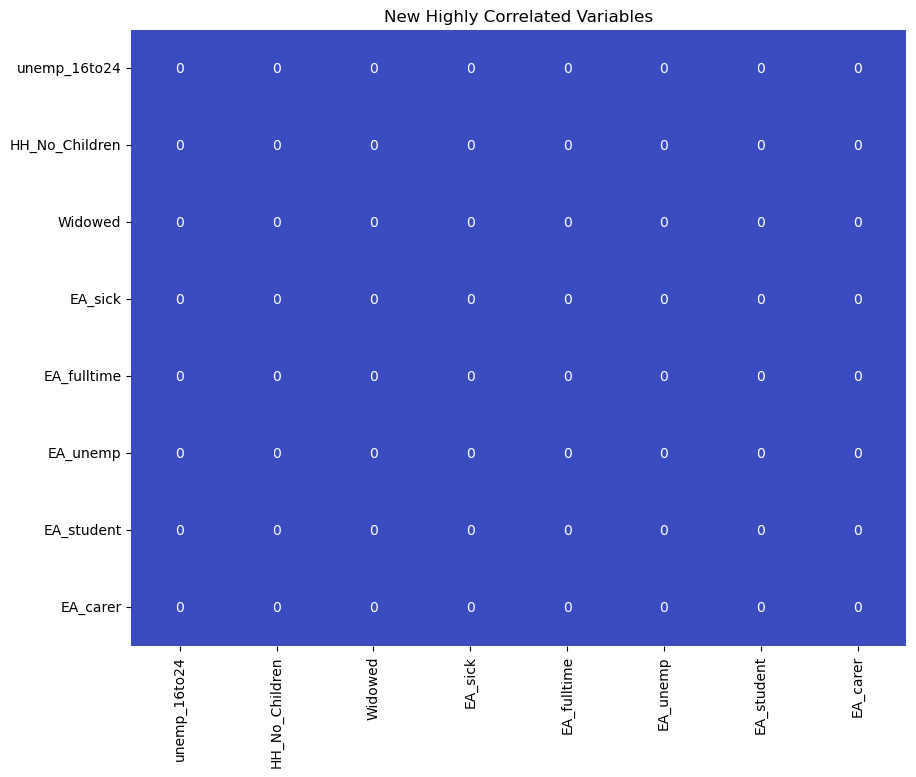

In [181]:
# Now lets check again....
corr_2 = z_score_str.corr()
corr_2.style.background_gradient(cmap='coolwarm')

threshold = 0.7
highly_correlated_2 = (corr_2.abs() > threshold) & (corr_2.abs() < 1.0)

plt.figure(figsize=(10, 8))
sns.heatmap(highly_correlated_2, cmap='coolwarm', cbar=False, annot=True)

plt.title('New Highly Correlated Variables')
plt.show()

#Wahoo!!!, but before running the next part of the process, we also need to get ride of the NaN values. What a nightmare I know!.

Here is the cleaned correlated variables omitting

In [185]:
# # There are many ways we can use to deal with the NaN values, one of those is **Imputation**: The idea behind it to replace NaN values with an 
# estimate based on the rest of the data. Common methods include using the mean, median, or mode of the column. We will try the mean. 
# Of couse that will depend of the nature of the variable, this is just an example.

z_score_str.fillna(z_score_str.mean(), inplace=True)

In [186]:
contains_nan = z_score_str.isna().any().any()

if contains_nan:
    print("Oh no :( the DataFrame contains NaN values.")
else:
    print("Wahoo! the dataFrame does not contain NaN values. I'm the best")

Wahoo! the dataFrame does not contain NaN values. I'm the best


---

**7**. Utilize the k-means clustering algorithm to create a classification based on the selected variables.

In [187]:
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist, pdist

# KMeans with 10 clusters
kmeans = KMeans(n_clusters=10)
kmeans.fit(z_score_str)
labels = kmeans.predict(z_score_str)
cluster_centres = kmeans.cluster_centers_
z_score_str['Cluster'] = kmeans.labels_

C:\Users\norab\miniforge3\envs\ua\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


In [188]:
z_score_str.head()

,unemp_16to24,HH_No_Children,Widowed,EA_sick,EA_fulltime,EA_unemp,EA_student,EA_carer,Cluster
0,0.0,3.367879,-0.439178,-1.012074,0.074779,-1.225293,-0.497372,-0.969271,2
1,0.0,3.367879,-0.439178,-1.012074,0.074779,-1.225293,-0.497372,-0.969271,2
2,0.0,3.367879,-0.439178,-1.012074,0.074779,-1.225293,-0.497372,-0.969271,2
3,0.0,3.367879,-0.439178,-1.012074,0.074779,-1.225293,-0.497372,-0.969271,2
4,0.0,3.367879,-0.439178,-1.012074,0.074779,-1.225293,-0.497372,-0.969271,2


(array([ 90., 130.,  99., 110.,  90.,  20.,  10., 110.,  31.,  60.]),
 array([0. , 0.9, 1.8, 2.7, 3.6, 4.5, 5.4, 6.3, 7.2, 8.1, 9. ]),
 <BarContainer object of 10 artists>)

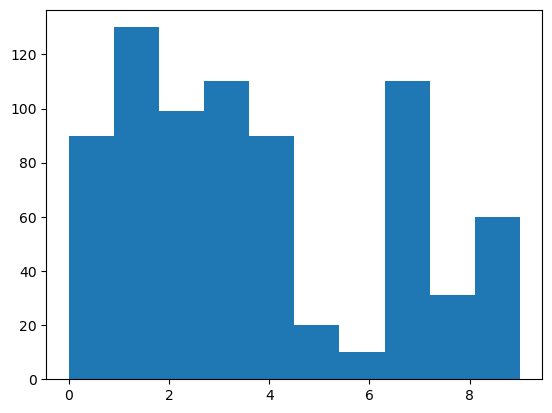

In [189]:
plt.hist(labels)
# Ok, we clustered the data, but we subjectively defined the number of clusters, 
# and as you can see is one of the key parameters

Here is the histogram demonstrating the frequency counts of the various k means clusters.

---

**8**. Define the optimum number of clusters (i.e., using the Elblow method). Experiment with different values of k.

C:\Users\norab\miniforge3\envs\ua\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\norab\miniforge3\envs\ua\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\norab\miniforge3\envs\ua\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\norab\miniforge3\envs\ua\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is k

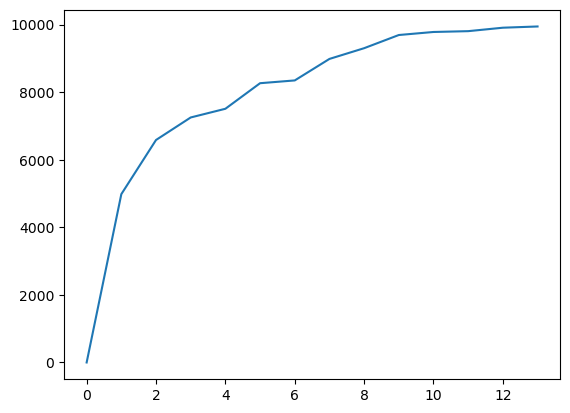

In [191]:
import numpy as np
def elbow(stirling_census_data, n):
    kMeansVar = [KMeans(n_clusters=k).fit(stirling_census_data.values) for k in range(1, n)] #making use of list comprehensions.
    centroids = [X.cluster_centers_ for X in kMeansVar]
    k_euclid = [cdist(stirling_census_data.values, cent) for cent in centroids]
    dist = [np.min(ke, axis=1) for ke in k_euclid]
    wcss = [sum(d**2) for d in dist]
    tss = sum(pdist(stirling_census_data.values)**2)/stirling_census_data.values.shape[0]
    bss = tss - wcss
    plt.plot(bss)
    plt.show()
 
elbow(z_score_str,15)

The elbow marker for k means clusters indicates the optimum number of clusters for this geodemographic classification comes at 6.

In [192]:
# KMeans with 6 clusters, after the validation with the Elbow method.
kmeans = KMeans(n_clusters=6)
kmeans.fit(z_score_str)
labels = kmeans.predict(z_score_str)
cluster_centres = kmeans.cluster_centers_

z_score_str['Cluster'] = kmeans.labels_

C:\Users\norab\miniforge3\envs\ua\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


---

**9**. Evaluate your cluster groups (e.g., using PCA) and interpret your cluster centres. Describe your results and repeat the process to adjust the variable selection and cluster groups to provide more meaningful results for your geodemographic goal. Interpret the characteristics of each cluster. What demographic patterns or similarities are prevalent within each group?

**TRYING k = 6**

Evaluating cluster groups using PCA:

In [194]:
# Code based on the example provided here: 
# https://scikit-learn.org/stable/auto_examples/decomposition/plot_pca_iris.html#sphx-glr-auto-examples-decomposition-plot-pca-iris-py

import plotly.express as px
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

plt.figure(figsize=(12, 8))

kmeans = KMeans(n_clusters=6)
clusters = kmeans.fit_predict(z_score_str)

z_score_str['Cluster'] = clusters

scaler = StandardScaler()
stand_data_scaled = scaler.fit_transform(z_score_str)

# PCA analysys.
pca = PCA(n_components=2).fit(stand_data_scaled)
pca_result = pca.transform(stand_data_scaled)

#Percentage of variance explained by each of the selected components.
variance_ratio = pca.explained_variance_ratio_

# Create a scatter plot
fig = px.scatter(x=pca_result[:, 0], y=pca_result[:, 1], color=clusters,
                 labels={'color': 'Cluster'},
                 #title='Cluster Plot against 1st 2 Principal Components',
                 opacity=0.7,
                 width=800, 
                 height=800)

plt.tight_layout()
fig.show()

print(f"These two components explain {(variance_ratio.sum()*100):.2f}% of the point variability.")

C:\Users\norab\miniforge3\envs\ua\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


These two components explain 48.60% of the point variability.


<Figure size 1200x800 with 0 Axes>

C:\Users\norab\miniforge3\envs\ua\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.



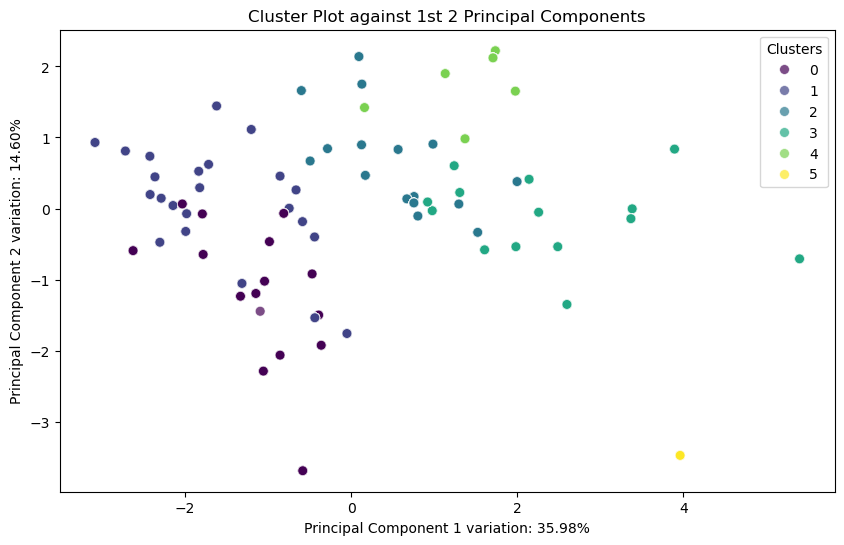

In [195]:
# Here is a static figure with the point variability included in the x/y-axis label.
# So we can see what variability is provided by each component.

kmeans = KMeans(n_clusters=6)
clusters = kmeans.fit_predict(z_score_str)

z_score_str['Cluster'] = clusters

# Standardize the data for PCA
scaler = StandardScaler()
stand_data_scaled = scaler.fit_transform(z_score_str)

# PCA
pca = PCA(n_components=2).fit(stand_data_scaled)
pca_result = pca.transform(stand_data_scaled)

#Percentage of variance explained by each of the selected components.
variance_ratio = pca.explained_variance_ratio_

plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_result[:, 0], y=pca_result[:, 1], hue=clusters, palette='viridis', s=50, alpha=0.7)
plt.title('Cluster Plot against 1st 2 Principal Components')
plt.xlabel(f'Principal Component 1 variation: {variance_ratio[0]*100:.2f}%')
plt.ylabel(f'Principal Component 2 variation: {variance_ratio[1]*100:.2f}%')
plt.legend(title='Clusters')
plt.show()


In [197]:
# KMeans clustering
kmeans = KMeans(n_clusters=6)
clusters = kmeans.fit_predict(z_score_str)

# Get the cluster centers
cluster_centers = kmeans.cluster_centers_


# Get the cluster centers
cluster_centers = pd.DataFrame(kmeans.cluster_centers_, columns=z_score_str.columns)

# Create a new DataFrame with cluster assignments and column names
#result_df = pd.DataFrame({'Cluster': clusters, 'Column': z_score_df.columns})

cluster_centers.head(6)

C:\Users\norab\miniforge3\envs\ua\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.



,unemp_16to24,HH_No_Children,Widowed,EA_sick,EA_fulltime,EA_unemp,EA_student,EA_carer,Cluster
0,-0.108564,2.047110,-0.585302,-1.002293,0.945108,-1.164997,-0.460797,-0.532876,1.000000e+00
1,0.034421,0.251572,-0.146171,0.283142,-0.395380,0.384495,-0.224035,0.417477,2.200000e+00
2,-0.374104,-0.176935,-0.234632,-0.688946,0.978184,-0.460153,-0.251819,-0.371155,8.181818e-01
3,1.383071,-0.557053,0.167660,1.516598,-1.095151,1.464635,-0.347643,-0.174478,3.000000e+00
4,-0.420343,-0.005410,0.422849,0.223516,-0.081237,-0.674023,1.032694,-0.677300,-6.661338e-16
5,-0.155868,-0.791303,0.654725,-0.463111,-0.912889,0.139607,0.613165,1.669968,4.142857e+00


---

**10**. Map the final cluster groups (Answers to #9 continue below)

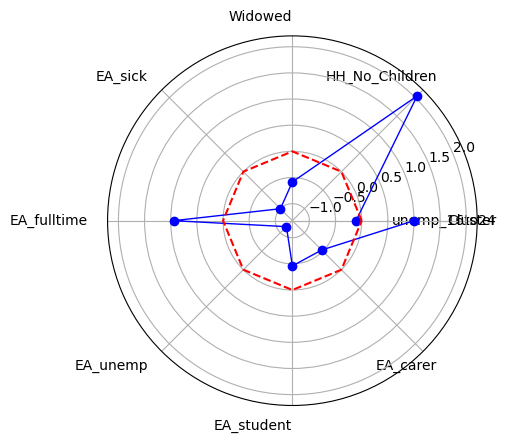

In [198]:
# Code adapted from:
# https://matplotlib.org/stable/gallery/pie_and_polar_charts/polar_demo.html

first_row_centers = cluster_centers.iloc[0, :]

# len of features
num_features = len(first_row_centers)

# polar coordinates
theta = np.linspace(0, 2 * np.pi, num_features, endpoint=True)

fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
ax.plot(theta, first_row_centers, linewidth=1, color='blue', marker='o', label='Centers')
# Add an extra red line at the 0.0 value
ax.plot(theta, np.zeros_like(first_row_centers), color='red', linestyle='--', label='Average')

ax.set_xticks(theta)
ax.set_xticklabels(cluster_centers.columns, rotation=45, ha='right')

plt.show()
#Ignore the cluster polar values, and focus in he census variables.

**CLUSTER 1**

Interpretation: For cluster 1 there are mixed demographics with a high proportion of married household without children, full-time employment, and relative unemployment for those age 16-24. This cluster is likely to be populated with young professionals and perhaps students in college or university that are unemployed.

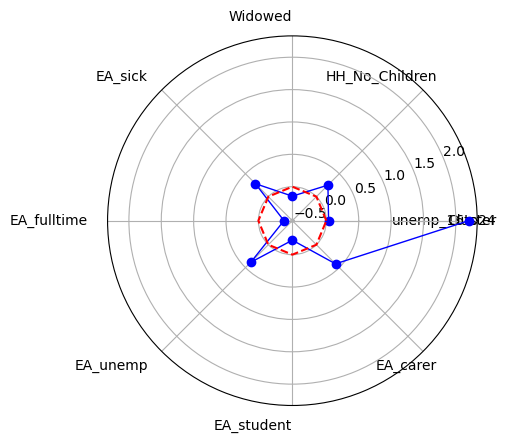

In [209]:
second_row_centers = cluster_centers.iloc[1, :]

# len of features
num_features = len(second_row_centers)

# polar coordinates
theta = np.linspace(0, 2 * np.pi, num_features, endpoint=True)

fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
ax.plot(theta, second_row_centers, linewidth=1, color='blue', marker='o', label='Centers')
# Add an extra red line at the 0.0 value
ax.plot(theta, np.zeros_like(second_row_centers), color='red', linestyle='--', label='Average')

ax.set_xticks(theta)
ax.set_xticklabels(cluster_centers.columns, rotation=45, ha='right')

plt.show()
#Ignore the cluster polar values, and focus in he census variables.

**CLUSTER 2**

Interpretation: This cluster does not illuminate much other than a high proportion of unemployed young people.

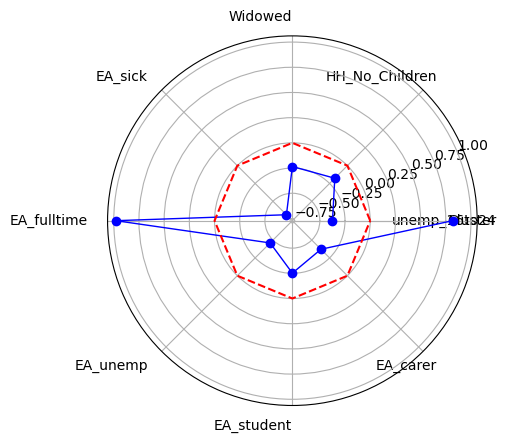

In [200]:
third_row_centers = cluster_centers.iloc[2, :]

# len of features
num_features = len(third_row_centers)

# polar coordinates
theta = np.linspace(0, 2 * np.pi, num_features, endpoint=True)

fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
ax.plot(theta, third_row_centers, linewidth=1, color='blue', marker='o', label='Centers')
# Add an extra red line at the 0.0 value
ax.plot(theta, np.zeros_like(third_row_centers), color='red', linestyle='--', label='Average')

ax.set_xticks(theta)
ax.set_xticklabels(cluster_centers.columns, rotation=45, ha='right')

plt.show()
#Ignore the cluster polar values, and focus in he census variables.

**CLUSTER 3**

Interpretation: This cluster has a high proportion of full-time employed residents, suggesting more financially secure area.

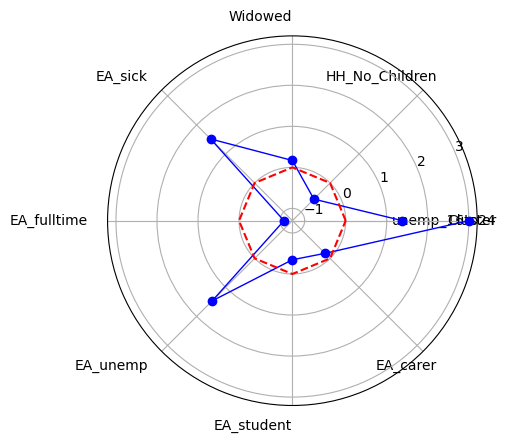

In [201]:
fourth_row_centers = cluster_centers.iloc[3, :]

# len of features
num_features = len(fourth_row_centers)

# polar coordinates
theta = np.linspace(0, 2 * np.pi, num_features, endpoint=True)

fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
ax.plot(theta, fourth_row_centers, linewidth=1, color='blue', marker='o', label='Centers')
# Add an extra red line at the 0.0 value
ax.plot(theta, np.zeros_like(fourth_row_centers), color='red', linestyle='--', label='Average')

ax.set_xticks(theta)
ax.set_xticklabels(cluster_centers.columns, rotation=45, ha='right')

plt.show()
#Ignore the cluster polar values, and focus in he census variables.

**CLUSTER 4**

Interpretation: Cluster 4 has a high proportion of unemployment broadly, specifically for young people and also people who are economically inactive due to long-term disability or sickness. This cluster appears to be mixed in demographic distribution but it is likely that there is a significant population of elderly because they are no longer working and likely suffer from long-term conditions.

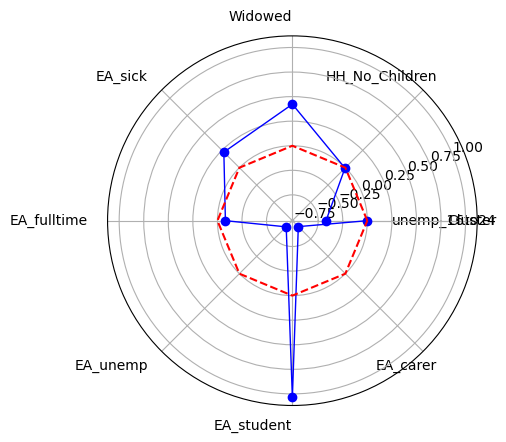

In [202]:
fifth_row_centers = cluster_centers.iloc[4, :]

# len of features
num_features = len(fifth_row_centers)

# polar coordinates
theta = np.linspace(0, 2 * np.pi, num_features, endpoint=True)

fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
ax.plot(theta, fifth_row_centers, linewidth=1, color='blue', marker='o', label='Centers')
# Add an extra red line at the 0.0 value
ax.plot(theta, np.zeros_like(fifth_row_centers), color='red', linestyle='--', label='Average')

ax.set_xticks(theta)
ax.set_xticklabels(cluster_centers.columns, rotation=45, ha='right')

plt.show()
#Ignore the cluster polar values, and focus in he census variables.

**CLUSTER 5**

Interpretation: This cluster is very clearly dominated by students, likely to be affiliated with the University of Stirling, which has a student population of over 18,000 students.

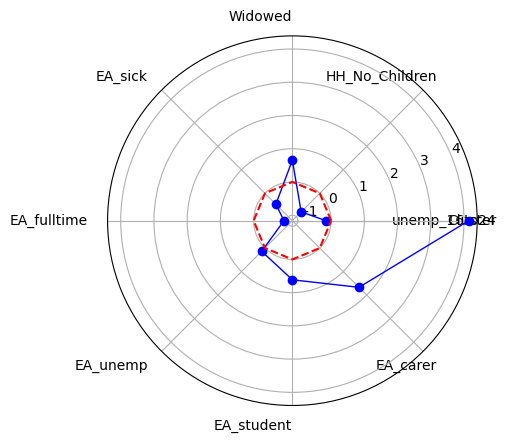

In [203]:
sixth_row_centers = cluster_centers.iloc[5, :]

# len of features
num_features = len(sixth_row_centers)

# polar coordinates
theta = np.linspace(0, 2 * np.pi, num_features, endpoint=True)

fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
ax.plot(theta, sixth_row_centers, linewidth=1, color='blue', marker='o', label='Centers')
# Add an extra red line at the 0.0 value
ax.plot(theta, np.zeros_like(sixth_row_centers), color='red', linestyle='--', label='Average')

ax.set_xticks(theta)
ax.set_xticklabels(cluster_centers.columns, rotation=45, ha='right')

plt.show()
#Ignore the cluster polar values, and focus in he census variables.

**CLUSTER 6**

Interpretation: This cluster represents a young, underemployed zone.

In [204]:
list(z_score_str.columns)

['unemp_16to24',
 'HH_No_Children',
 'Widowed',
 'EA_sick',
 'EA_fulltime',
 'EA_unemp',
 'EA_student',
 'EA_carer',
 'Cluster']

In [206]:
z_score_str.drop(['unemp_16to24',
 'HH_No_Children',
 'Widowed',
 'EA_sick',
 'EA_fulltime',
 'EA_unemp',
 'EA_student',
 'EA_carer'], axis=1, inplace=True)
z_score_str.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 750 entries, 0 to 749
Data columns (total 1 columns):
 #   Column   Non-Null Count  Dtype
---  ------   --------------  -----
 0   Cluster  750 non-null    int32
dtypes: int32(1)
memory usage: 3.1 KB


In [207]:
# Concatenate the resulting tables.
final_df = pd.concat([stirling_census_data, z_score_str], axis=1, ignore_index=False)
final_df.head()

,matched_oa_code,geometry,Edu_Level4,Edu_Level0,unemp_16to24,unemp_never,Single,Married,HH_No_Children,Family_Students,...,Widowed,EA_sick,EA_fulltime,EA_unemp,EA_student,EA_carer,F. Construction,Health,P. Education,Cluster
0,S00107863,"MULTIPOLYGON (((-471371.161 7655867.505, -4713...",26.0,23.0,NaN,NaN,21.0,62.0,29.166667,NaN,...,5.0,3.225806,41.935484,2.150538,2.150538,2.150538,2,5,6,1
1,S00107863,"POLYGON ((-515926.562 7653190.910, -515940.917...",26.0,23.0,NaN,NaN,21.0,62.0,29.166667,NaN,...,5.0,3.225806,41.935484,2.150538,2.150538,2.150538,2,5,6,1
2,S00107863,"POLYGON ((-480401.205 7651602.681, -480252.151...",26.0,23.0,NaN,NaN,21.0,62.0,29.166667,NaN,...,5.0,3.225806,41.935484,2.150538,2.150538,2.150538,2,5,6,1
3,S00107863,"POLYGON ((-481410.877 7653951.833, -481421.253...",26.0,23.0,NaN,NaN,21.0,62.0,29.166667,NaN,...,5.0,3.225806,41.935484,2.150538,2.150538,2.150538,2,5,6,1
4,S00107863,"POLYGON ((-520829.748 7650894.447, -520852.468...",26.0,23.0,NaN,NaN,21.0,62.0,29.166667,NaN,...,5.0,3.225806,41.935484,2.150538,2.150538,2.150538,2,5,6,1


# Lab No 7: Spatial Microsimulation
As instructed in the lab on 28/3/25, Lab No 7 does not include any challenges to complete. Instead, I will demonstrate my understanding of Spatial Microsimulation by annotating the process

**Pull Data Here**
- lab_7/age.csv
- lab_7/ind-full.csv
- lab_7/ind.csv
- lab_7/sex.csv

**Assembling the environment**

In [210]:
!pip install ipfn
import pandas as pd
import numpy as np
import copy

C:\Users\norab\miniforge3\envs\ua\Lib\threading.py:986: ResourceWarning:

unclosed file <_io.BufferedWriter name=5>

C:\Users\norab\miniforge3\envs\ua\Lib\threading.py:986: ResourceWarning:

unclosed file <_io.BufferedReader name=6>

C:\Users\norab\miniforge3\envs\ua\Lib\threading.py:986: ResourceWarning:

unclosed file <_io.BufferedReader name=7>



In [212]:
# Here is the individual level data set
ind = pd.read_csv('lab_7/ind-full.csv')
ind

,id,age,sex,income
0,1,59,m,2868
1,2,54,m,2474
2,3,35,m,2231
3,4,73,f,3152
4,5,49,f,2473


Constraint data in Spatial Microsimulation is localised area aggregate data (ex. census counts) that the synthetic population needs to match in order to be realistic. The constraints for this microsimulation are assembled below.

In [213]:
con_sex = pd.read_csv('lab_7/sex.csv')
con_age = pd.read_csv('lab_7/age.csv')

In [214]:
con_age

,a0.49,a.50+
0,8,4
1,2,8
2,7,4


Here we can interpret that zone 1 has 8 people aged 49 or below with 4 above 50, zone 2 with 8 people over 50 and only 2 below, third and finally, zone 3 has 7 people below 50 and 4 above.

In [216]:
con_sex

,m,f
0,6,6
1,4,6
2,3,8


Here we can see there are 6 men and 6 women in zone 1, 4 women and 6 men in zone 2, and 8 women and only 3 men in zone 3.

In [215]:
# Check that the totals of the two constraints tables match
print ("con_age total:", con_age.values.sum(), "; con_sex total:", con_sex.values.sum())

# Check the row totals (i.e. area populations match)
print ("con_age row sums:", con_age.sum(axis=1).values, "; con_sex row sums:", con_sex.sum(axis=1).values)

# Test row sum equivalence
con_age.sum(axis=1) == con_sex.sum(axis=1)

con_age total: 33 ; con_sex total: 33
con_age row sums: [12 10 11] ; con_sex row sums: [12 10 11]


0    True
1    True
2    True
dtype: bool

The .values.sum function computes the sum counts of each zone within our variables to ensure that they match. Row sums ensures the area populations are the same and finally the row sum equivalence establishes whether or not they are equal.

In [217]:
# Store the full individidual dataset as ind_orig. 
# Use copy do make a 'deep' copy.
ind_orig = ind.copy()
# Drop the income field
ind = ind.drop(['income'],axis=1)
ind

,id,age,sex
0,1,59,m
1,2,54,m
2,3,35,m
3,4,73,f
4,5,49,f


Here we only need to reweight age and sex variables, so to avoid excess noise we need to remove income field.

In [218]:
# Now recategorise the age variable
ind['age'] = pd.to_numeric(ind['age'])

# overwrite the age variable with categorical age
ind['age'] = pd.cut(ind['age'], [0,49,120], labels = ['a0_49','a50+'])
ind

,id,age,sex
0,1,a50+,m
1,2,a50+,m
2,3,a0_49,m
3,4,a50+,f
4,5,a0_49,f


Here align the categories so they match the format of aggregate data like the census (ie. the age data indicates which bin the person falls into whether theyre under 50 or above)

In [219]:
ind.age

0     a50+
1     a50+
2    a0_49
3     a50+
4    a0_49
Name: age, dtype: category
Categories (2, object): ['a0_49' < 'a50+']

In [220]:
con_age.columns

Index(['a0.49', 'a.50+'], dtype='object')

In [221]:
# Rename the con_age fields to match the categories in the ind table
con_age = con_age.rename(columns={'a0.49':'a0_49','a.50+':'a50+'})
con_age

,a0_49,a50+
0,8,4
1,2,8
2,7,4


The lines of code above are matching the category variables to make sure the names are correct across the constraints.

In [222]:
# Finally create a single constraint object by merging the constraints tables.
cons = con_age.merge(con_sex,left_index=True,right_index=True)
cons

,a0_49,a50+,m,f
0,8,4,6,6
1,2,8,4,6
2,7,4,3,8


In [223]:
# Here we're getting the dimensions of the individual agreggate (ind.csv) and the constraint datasets
print ("Shape of ind:",ind.shape)
print ("Shape of cons:",cons.shape)

Shape of ind: (5, 3)
Shape of cons: (3, 4)


In [224]:
# we need to 'flatten' the individual dataset as the dimensions differ.
# This means that responses become fields, and values become booleans, with rows reflecting individuals
age_pivot = pd.pivot_table(ind,columns=['age'],values='id', index=ind.index, aggfunc=len, fill_value=0, observed=False )

# The last square bracket bit ensures that the column order is male then female.
sex_pivot = pd.pivot_table(ind,columns=['sex'],values='id', index=ind.index, aggfunc=len, fill_value=0, observed=False )[['m','f']]

This code is taking the individual level survey data into the format (ie. flattening) that can be easily comparedd with the aggregate constraints data (cons).

In [225]:
age_pivot

age,a0_49,a50+
0,0,1
1,0,1
2,1,0
3,0,1
4,1,0


Pivot takes the long-format table into a wide-format table where each attribute exists as its own columns and there is a sorting into 0/1 based on the presence of values or not.

In [228]:
# merge pivoted data to make flatten dataframe
ind_cat = pd.DataFrame(age_pivot.to_records()).merge(pd.DataFrame(sex_pivot.to_records()),left_index=True,right_index=True)
# drop intermediate columns
ind_cat = ind_cat.drop(['index_x','index_y'],axis=1)
ind_cat

,a0_49,a50+,m,f
0,0,1,1,0
1,0,1,1,0
2,1,0,1,0
3,0,1,0,1
4,1,0,0,1


Here we created a categorical matrix where each person has their own row designating their binary variable characteristic.

In [229]:
# Check the columns sums to be sure ind_cat is correct
ind_cat.sum(axis=0)

# store these values
ind_agg = ind_cat.sum(axis=0)
ind_agg

# Now the survey data is in the same shape as the cons data in terms of how the columns are set up.

a0_49    2
a50+     3
m        3
f        2
dtype: int64

The above lines are just checking to make sure the aggregate and constraint data are layered correctly


In [230]:
test = pd.concat([cons.iloc[0], ind_agg], axis=1).transpose()
test

,a0_49,a50+,m,f
0,8,4,6,6
0,2,3,3,2


.Concat merges the constraints to the individual aggregate data and .transpose rotates the axis of the test merge

In [231]:
# This example will calculate the weights for zone 1.
# The process acts on the dataframe of individual observations.
# We'll make a copy of the individuals to preserve the originals.
ind_copy = ind.copy()
ind_copy

,id,age,sex
0,1,a50+,m
1,2,a50+,m
2,3,a0_49,m
3,4,a50+,f
4,5,a0_49,f


We duplicated the dataset and stored in in its own location ind_copy

In [237]:
ind_copy['weight'] = np.ones(5)
ind_copy

,id,age,sex,weight
0,1,a50+,m,1.0
1,2,a50+,m,1.0
2,3,a0_49,m,1.0
3,4,a50+,f,1.0
4,5,a0_49,f,1.0


In [238]:
ind_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5 entries, 0 to 4
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype   
---  ------  --------------  -----   
 0   id      5 non-null      int64   
 1   age     5 non-null      category
 2   sex     5 non-null      object  
 3   weight  5 non-null      float64 
dtypes: category(1), float64(1), int64(1), object(1)
memory usage: 381.0+ bytes


In [239]:
# Now, we must convert the age variable from the categorical data format created by pd.cut() to string objects.
# The ipfn library can't handle categorical datatypes for some reason.
ind_copy['age'] = ind_copy['age'].astype(str)
ind_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5 entries, 0 to 4
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   id      5 non-null      int64  
 1   age     5 non-null      object 
 2   sex     5 non-null      object 
 3   weight  5 non-null      float64
dtypes: float64(1), int64(1), object(2)
memory usage: 292.0+ bytes


In [240]:
# Now get the aggregates (marginals) and dimmension for zone 1 for age and sex.
# We need this structure to run the ipf method in python.

age = cons.iloc[0,[0,1]]
sex = cons.iloc[0,[2,3]]

aggregates = [age,sex]
dimensions = [['age'],['sex']]

print(aggregates)
print(dimensions)

[a0_49    8
a50+     4
Name: 0, dtype: int64, m    6
f    6
Name: 0, dtype: int64]
[['age'], ['sex']]


This is an important step for conducting an IPF. Here we're creating the aggregates for zone 1 

In [253]:
#Now, we can use the library to avoid implementing the algorithm from scratch.
# https://github.com/Dirguis/ipfn
from ipfn import ipfn
ipf = ipfn.ipfn(ind_copy,aggregates,dimensions,weight_col='weight',convergence_rate = 1e-15)
out = ipf.iteration()
out

ipfn converged: convergence_rate not updating or below rate_tolerance


,sex,age,id,weight
0,m,a50+,1,1.227998
1,m,a50+,2,1.227998
2,m,a0_49,3,3.544004
3,f,a50+,4,1.544004
4,f,a0_49,5,4.455996


This step adjusts the weights on individual leavel data so it can mirror totals for the wider area.

In [255]:
# Set up individuals
ind_copy_2 = ind.copy()
ind_copy_2['age'] = ind_copy_2['age'].astype(str)


# First, create some intuitive names for the totals
n_zones = len(cons) # number of zones


# Now, let's do this for each zone; maybe not the most efficient loop :)
for i in range(0,n_zones):
    # Make weights column for zone i
    ind_copy_2['weight_' + str(i)] = np.ones(5)
    
    # Now get the aggregates (marginals) for zone i for age and sex.
    age = cons.iloc[i,[0,1]]
    sex = cons.iloc[i,[2,3]]
    
    # Do iterative proportional fitting
    ipf = ipfn.ipfn(ind_copy_2, [age,sex],[['age'],['sex']],weight_col='weight_'+str(i),convergence_rate = 1e-15)
    ind_copy_2 = ipf.iteration()

ind_copy_2

ipfn converged: convergence_rate not updating or below rate_tolerance
ipfn converged: convergence_rate not updating or below rate_tolerance
ipfn converged: convergence_rate not updating or below rate_tolerance


,sex,age,id,weight_0,weight_1,weight_2
0,m,a50+,1,1.227998,1.725083,0.725083
1,m,a50+,2,1.227998,1.725083,0.725083
2,m,a0_49,3,3.544004,0.549834,1.549834
3,f,a50+,4,1.544004,4.549834,2.549834
4,f,a0_49,5,4.455996,1.450166,5.450166


Here we're performing IPF across all the generated zones, tailoring each weight to match the known demographics we have for each zone.

In [254]:
# Check that the weights obtained make sense.
# Now create the marginal distribution of individuals in each zone.
ind_agg0 = cons.apply(lambda x: 1.0*ind_agg, axis=0).T[0:3].reset_index(drop=True)

ind_agg3 = (ind_agg0 * np.nan).copy()

for i in range(0,n_zones):
    ind_agg3.iloc[i] = ind_cat.apply(lambda x: x*ind_copy_2['weight_'+str(i)],axis=0).sum(axis=0)

ind_agg3

,a0_49,a50+,m,f
0,8.0,4.0,6.0,6.0
1,2.0,8.0,4.0,6.0
2,7.0,4.0,3.0,8.0


First we ensure the weights make sense, creating the marginal distribution of individuals we have for each zone. Next, making an empty dataframe to store the marginal distributions that we loop through. The purpose of this code is to adjust the marginal distributions of the population based on the weights we calculated above. By adjusting these distributions we can match the demographic totals for each zone.

In [244]:
# Compare above with constraints - success!
cons

,a0_49,a50+,m,f
0,8,4,6,6
1,2,8,4,6
2,7,4,3,8


In [256]:
# The weights generated are fractional, to allcoate individuals to zones 
# we need to convert these to integers. Ideally, with a minimum loss of information.

# We'll start with a function for a method called 'proportional probabilities'.
def int_pp(weights):
    # convert to a vector if required
    xv = np.array(weights).ravel()
    # Sample the individuals
    rsum = round(xv.sum())
    xs = np.random.choice(len(xv),int(rsum),True,xv/xv.sum())
    # return the result
    return np.bincount(xs,minlength=len(xv))

In [246]:
# Run the function five times for two set of values
np.random.seed(24)
values = [[0.333, 0.667, 3], [1.333, 1.333, 1.333]]

for i, v in enumerate(values, 1):
    print(f"Results for set {i}:")
    for j in range(5):
        result = int_pp(v)
        print(f"Iteration {j+1}: {result}")
    print()

Results for set 1:
Iteration 1: [0 1 3]
Iteration 2: [0 0 4]
Iteration 3: [0 1 3]
Iteration 4: [0 1 3]
Iteration 5: [0 0 4]

Results for set 2:
Iteration 1: [1 1 2]
Iteration 2: [0 1 3]
Iteration 3: [1 2 1]
Iteration 4: [0 2 2]
Iteration 5: [1 1 2]



The purpose of this code is to show that the proportional probability works and can return the correct information based on the defined weights.

In [247]:
# Lovelace and Ballas (2013) suggest a truncate, replicate, sample 'TRS' approach to deal with this.
# In effect this means that any individual with weight > 1 is sampled at least once.

def int_trs(weights):
    # convert to a vector if required
    xv = np.array(weights).ravel()
    # truncate - just get the integer part of the weight
    xint = np.floor(xv)
    # Get the decimal bit of the weight
    r = xv - xint
    # Work out the deficit population
    frac_sum = round(r.sum())
    # Sample based upon the deficit bit
    xs = np.random.choice(len(xv),int(frac_sum),True,r/r.sum())
    # Get the result of the deficit part
    topup = np.bincount(xs,minlength=len(xv))
    return xint + topup

In [248]:
# Test this function
np.random.seed(24) # This seed reproduces the answer.
values = [[0.333, 0.667, 3], [1.333, 1.333, 1.333]]

for i, v in enumerate(values, 1):
    print(f"Results for set {i}:")
    for j in range(5):
        result = int_trs(v)
        print(f"Iteration {j+1}: {result}")
    print()

Results for set 1:
Iteration 1: [0. 1. 3.]
Iteration 2: [0. 1. 3.]
Iteration 3: [0. 1. 3.]
Iteration 4: [1. 0. 3.]
Iteration 5: [0. 1. 3.]

Results for set 2:
Iteration 1: [1. 1. 2.]
Iteration 2: [1. 1. 2.]
Iteration 3: [2. 1. 1.]
Iteration 4: [2. 1. 1.]
Iteration 5: [1. 2. 1.]



Here the key difference is int_pp to int_trs, where trs handles aggregation by making sure that any individual with weight > 1 is sampled at least once.

In [257]:
# Now use the TRS approach to integerisation to generate some microdata for SimpleWorld
# First, get integer weights for area 1
int_weight1 = int_trs(ind_copy_2['weight_0'])
int_weight1

array([1., 1., 4., 1., 5.])

Here are the final integer weights after truncating the fracional parts

In [258]:
# Integerised weights correspond to the number of repetitions of a given individual.
# Firstly, expand the weights
def int_expand_vector(weights):
    return np.repeat(range(0,len(weights)),weights.astype(int))

print (int_weight1)
print (int_expand_vector(int_weight1))

[1. 1. 4. 1. 5.]
[0 1 2 2 2 2 3 4 4 4 4 4]


In [262]:
# expand the indices for zone 1
exp_indices = int_expand_vector(int_weight1)
# Generate the microdata from the individuals table
ind_orig.iloc[exp_indices]

,id,age,sex,income
0,1,59,m,2868
1,2,54,m,2474
2,3,35,m,2231
2,3,35,m,2231
2,3,35,m,2231
2,3,35,m,2231
3,4,73,f,3152
4,5,49,f,2473
4,5,49,f,2473
4,5,49,f,2473


In [260]:
# Now let's put the integeristation and expansion together for all areas

indivs = []
for i in range(0, n_zones):
    # Integerise and expand
    ints = int_expand_vector(int_trs(ind_copy_2['weight_' + str(i)]))
    # Select the relevant individuals using .loc
    temp = ind_orig.loc[ints].copy()
    # Assign the 'zone' column
    temp['zone'] = i
    indivs.append(temp)

ints_df = pd.concat(indivs)
#Resetting the index of the resulting table.
ints_df.reset_index(drop=True, inplace=True)
ints_df

,id,age,sex,income,zone
0,1,59,m,2868,0
1,2,54,m,2474,0
2,3,35,m,2231,0
3,3,35,m,2231,0
4,3,35,m,2231,0
5,4,73,f,3152,0
6,4,73,f,3152,0
7,4,73,f,3152,0
8,5,49,f,2473,0
9,5,49,f,2473,0


---

# Final Remarks (limitations, barriers, and any additional comments)


Throughout the course of working with networks, geodemographic classification, and spatial microsimulation, several challenges and limitations emerged that impacted the analysis process. Below I have outlined the principal obstacles I encoutered completing this lab. I follow up with potential barriers that I faced and give some advice to amend those.

**Data Merging and Alignment Issues**:

   One of the most significant challenges encountered was ensuring that datasets from different sources were compatible for merging. The mismatch in identifiers (e.g., 'oa_code' vs. 'Output_Are') led to difficulties in joining the datasets, causing missing or incorrect values (NaNs). The geodemographic classification challenge in Week 6 was made much more complicated by this. I had a lot of trouble figure out how to merge these effectively and ultimately had to use external sources (of which are cited) to explore this because there was no guidance in the workbooks about this as a potential obstacle. The solution involved pre-processing the data by cleaning and standardizing the key variables (e.g., matching codes across datasets). However, even with methods such as fuzzy matching, there were instances where exact matches were not achievable, which may have resulted in less precise merges and data alignment. 

**Interpretability and Replicability of the Results**:

   While the final outputs from the IPF (Lab 7) and other techniques were mathematically consistent with the original aggregates, interpreting the implications of these adjustments in terms of demographic patterns was more challenging. This lab workbook does not synthesize challenges that can be replicated on our own process because so much of the workflow is contentgent on this very particular type of microsimulation. Also, the absence of clear challenges in Lab 7 led me to believe we just needed to annotate the workflow, demosntrating our understanding of the topic. I think this could've been more clear. The results often presented complex relationships between the variables that could not always be easily interpreted without additional domain knowledge or statistical expertise.

Another difficulty of note I discovered in Lab 5 Challenge 1, when we were instructed to create our own subset of the data to perform a betweenness centrality. There, instructions indicate we should follow the previous workflow, however in order to effectively obtain the measures of betweenness centrality you have to completely reprocess the data. I think a hint of this issue would have been beneficial, allowing us to follow the workflow without having to consult external sources. 

 **Challenges in Variable Selection**:
 
   The selection of appropriate variables for clustering and for use in spatial microsimulation (e.g., unemployment, education levels, age, sex) was not always clear-cut. While some variables clearly related to socioeconomic deprivation, the overlap and interdependencies between variables could lead to multicollinearity or the risk of overfitting models, which made interpretation of the results more difficult. Unfortunately, the assistance I hoped to gain regarding the census metadata was completely different from the notation used in the merged_census_data making it difficult to ascertain what each variable actually meant.


In conclusion, while the methods used in this analysis provide valuable insights into the spatial distribution of socioeconomic deprivation across the city of Stirling (Lab 6) , there remain numerous challenges that need to be addressed, especially related to data alignment,. With Lab 7 the principal difficulty was in comprehending the wider significance of the process we were undertaking because it was not clear how to transfer this data to our own situations. 